# Libraries Used

In [150]:
import warnings
warnings.filterwarnings(action='ignore')

In [187]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import lightgbm as lgb

In [188]:
from scipy.stats import pearsonr, iqr
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
# from pmdarima.utils import tsdisplay
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from scipy.stats import f_oneway
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error
from sklearn.preprocessing import MinMaxScaler
from statsmodels.tsa.stattools import pacf
from sklearn.model_selection import RandomizedSearchCV


# How can a meal delivery service improve operations?

## 📖 Background
Your client is a food company in India that provides meal delivery services to thousands of customers per week. They operate in 51 cities inside eight different regions of the country. To better serve their customers, they deliver meals from 77 fulfillment centers.

The company wants you to help them understand their customer base, meal preferences, and fluctuations in orders. They want to investigate ways to improve operations and reduce food waste.

## 💾 The data

Your client has provided you with almost three years of order information for each of their 77 fulfillment centers:

- "week" - week (1 - 145)
- "center_id" - id of the fulfillment center
- "city_code" - city identifier
- "region_code" - region identifier
- "center_type" - there are three types of centers: A, B, and C
- "op_area" - the size of the area serviced by the fulfillment center
- "meal_id" - each meal has a unique id
- "category" - food category (beverages, pasta, rice, etc.)
- "cuisine" - the type of cuisine for each meal
- "checkout_price" - the price the customer pays (including discounts, promotions, etc.)
- "base_price" - list price for the meal
- "emailer" - 1 if there was an email promotion for the meal, 0 otherwise
- "featured" - 1 if the website featured the meal, 0 otherwise
- "orders" - number of orders for that week for that meal id

In [4]:
import pandas as pd
deliveries = pd.read_csv('C:/Users/Biyan Bahtiar/Documents/Data Science and Analytics/Data Science/meal_deliveries.csv').sort_values(by='week')
deliveries

,id,week,center_id,city_code,region_code,center_type,op_area,meal_id,category,cuisine,checkout_price,base_price,emailer,featured,orders
114136,1276995,1,77,676,34,A,3.8,2306,Pasta,Italian,244.50,339.53,0,0,26
96763,1478891,1,72,638,56,C,3.9,1885,Beverages,Thai,133.86,134.86,0,1,769
189605,1275693,1,132,522,56,A,3.9,2139,Beverages,Indian,339.50,436.53,0,0,69
96636,1325813,1,74,702,35,A,2.8,1962,Pizza,Continental,589.82,612.13,1,0,81
189711,1291713,1,72,638,56,C,3.9,2760,Other Snacks,Thai,241.53,231.83,0,1,40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51485,1450815,145,108,579,56,B,4.4,2581,Pizza,Continental,563.60,563.60,0,0,271
34154,1427022,145,11,679,56,A,3.7,2139,Beverages,Indian,288.12,289.12,0,0,122
42025,1005716,145,94,632,34,C,3.6,2707,Beverages,Italian,205.64,207.64,0,0,285
196464,1131679,145,89,703,56,A,4.8,2104,Fish,Continental,640.23,639.23,0,0,42


## 💪 Competition challenge

Create a report that covers the following:
1. What are the most popular food categories in each region?
2. For each of the two cities with more than three fulfillment centers, would you recommend:
	* Keeping the number of centers the same,
	* Combine fulfillment centers, or
	* Opening new centers
3. Investigate the effectiveness of email campaigns and promoting meals on the website.
4. Explore ways of forecasting food order numbers to assist purchasing managers in their planning.

# Catatan

1. Objective function Order = x * MaxOrder per Center Type/Region/City per Cuisine/Category/Meal ID
2. Decision Variable = x
3. Constraint = Order Forecast

4. Cari tau berapa kapasitas maks order tiap center_type

# Data Cleaning

## Identifying Missing Values

In [5]:
round(deliveries.isna().sum()/len(deliveries)*100,2)

id                0.0
week              0.0
center_id         0.0
city_code         0.0
region_code       0.0
center_type       0.0
op_area           0.0
meal_id           0.0
category          0.0
cuisine           0.0
checkout_price    0.0
base_price        0.0
emailer           0.0
featured          0.0
orders            0.0
dtype: float64

No missing values detected

## Identifying Duplicates

In [6]:
deliveries.info()

<class 'pandas.core.frame.DataFrame'>
Index: 228274 entries, 114136 to 162455
Data columns (total 15 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   id              228274 non-null  int64  
 1   week            228274 non-null  int64  
 2   center_id       228274 non-null  int64  
 3   city_code       228274 non-null  int64  
 4   region_code     228274 non-null  int64  
 5   center_type     228274 non-null  object 
 6   op_area         228274 non-null  float64
 7   meal_id         228274 non-null  int64  
 8   category        228274 non-null  object 
 9   cuisine         228274 non-null  object 
 10  checkout_price  228274 non-null  float64
 11  base_price      228274 non-null  float64
 12  emailer         228274 non-null  int64  
 13  featured        228274 non-null  int64  
 14  orders          228274 non-null  int64  
dtypes: float64(3), int64(9), object(3)
memory usage: 27.9+ MB


In [7]:
deliveries.duplicated().sum()

0

In [8]:
deliveries.duplicated(subset=('id')).sum()

0

In [9]:
deliveries.duplicated(subset=['center_id', 'meal_id', 'week']).sum()

0

No duplicates identified

## Changing Data Type

In [10]:
deliveries.info()

<class 'pandas.core.frame.DataFrame'>
Index: 228274 entries, 114136 to 162455
Data columns (total 15 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   id              228274 non-null  int64  
 1   week            228274 non-null  int64  
 2   center_id       228274 non-null  int64  
 3   city_code       228274 non-null  int64  
 4   region_code     228274 non-null  int64  
 5   center_type     228274 non-null  object 
 6   op_area         228274 non-null  float64
 7   meal_id         228274 non-null  int64  
 8   category        228274 non-null  object 
 9   cuisine         228274 non-null  object 
 10  checkout_price  228274 non-null  float64
 11  base_price      228274 non-null  float64
 12  emailer         228274 non-null  int64  
 13  featured        228274 non-null  int64  
 14  orders          228274 non-null  int64  
dtypes: float64(3), int64(9), object(3)
memory usage: 27.9+ MB


All columns data type are workable

## Correcting Weird Value

In [11]:
col = list(set(deliveries.select_dtypes(include=['object', 'int64']).columns.to_list()) - set(['id','orders', 'week']))
for i in col:
  print(f'========{i}: {deliveries[i].nunique()} unique values========')
  print(deliveries[i].value_counts(), '\n')

========center_id: 77 unique values========
center_id
13     3551
10     3529
52     3518
43     3502
27     3501
       ... 
139    2270
57     2238
162    2173
41     2029
91     1734
Name: count, Length: 77, dtype: int64 

========category: 14 unique values========
category
Beverages       64152
Rice Bowl       16677
Sandwich        16607
Pizza           16507
Starters        14986
Other Snacks    14815
Desert          14565
Salad           14365
Pasta           13886
Seafood         13336
Biryani         10272
Extras           6682
Soup             6346
Fish             5078
Name: count, dtype: int64 

========meal_id: 51 unique values========
meal_id
1062    5640
1109    5638
2707    5633
1727    5610
1754    5589
1885    5583
1962    5563
1993    5558
2322    5555
1971    5537
2581    5491
1778    5486
2826    5481
1558    5453
2290    5429
1207    5407
2640    5365
1230    5326
2539    5316
1878    5286
2631    5139
2760    5117
1543    5081
1248    5075
2704    4978
2664    494

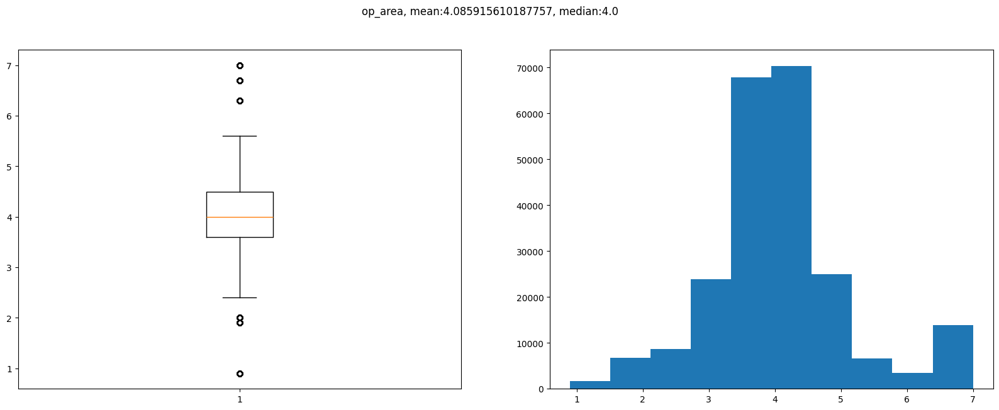

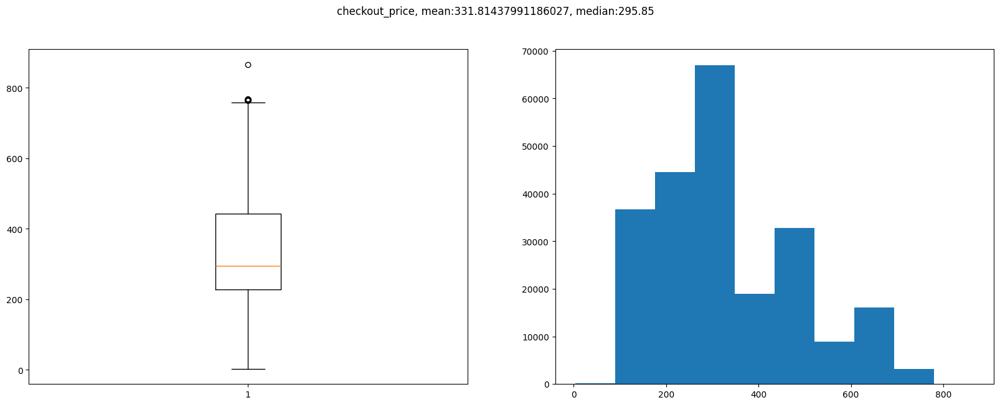

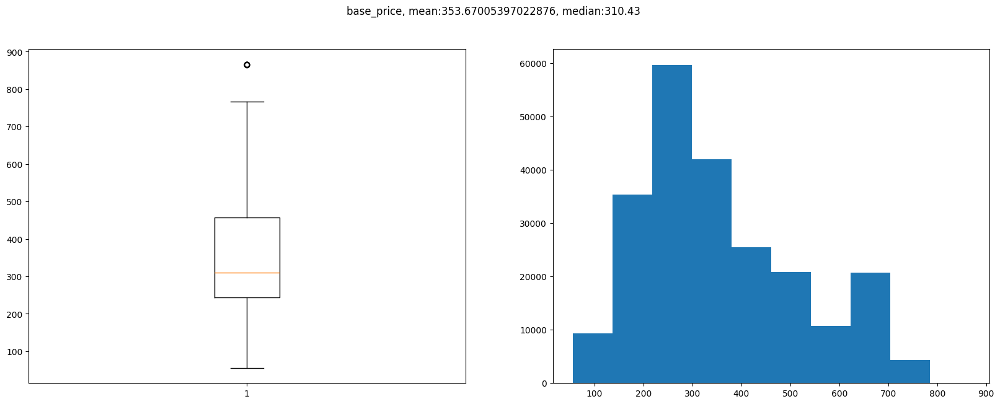

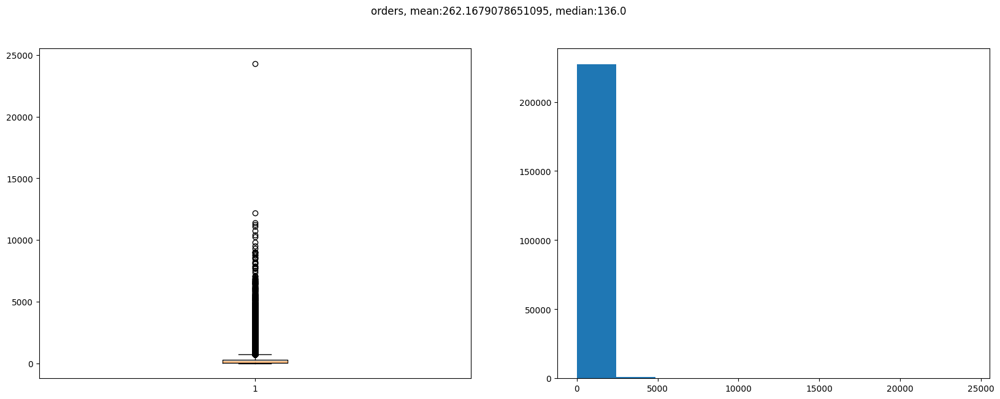

In [12]:
num_col = list(deliveries.select_dtypes('float64').columns)
num_col.append('orders')

for i in num_col:
  fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20,7))
  ax[0].boxplot(deliveries[i])

  ax[1].hist(deliveries[i])

  fig.suptitle(f'{i}, mean:{deliveries[i].mean()}, median:{deliveries[i].median()}')
  print('\n')
  plt.show()

In [13]:
deliveries.query("orders > 10000").sort_values(by='orders', ascending=False)

,id,week,center_id,city_code,region_code,center_type,op_area,meal_id,category,cuisine,checkout_price,base_price,emailer,featured,orders
131872,1452474,5,43,590,56,A,5.1,2290,Rice Bowl,Indian,159.08,311.43,1,1,24299
2879,1091831,5,137,590,56,A,4.4,2290,Rice Bowl,Indian,159.11,307.49,1,1,12177
226428,1398441,30,126,577,56,A,2.7,1754,Sandwich,Italian,144.56,279.36,1,1,11380
190170,1323375,5,104,647,56,A,4.5,2290,Rice Bowl,Indian,163.02,309.43,1,1,11246
178207,1062364,70,43,590,56,A,5.1,1754,Sandwich,Italian,192.12,279.42,1,1,11110
14528,1470093,5,13,590,56,B,6.7,2290,Rice Bowl,Indian,162.02,311.43,1,1,10745
72136,1233579,5,52,685,56,B,5.6,2290,Rice Bowl,Indian,157.14,310.43,1,1,10435
83577,1030363,5,108,579,56,B,4.4,2290,Rice Bowl,Indian,162.05,301.73,1,1,10259


<Axes: xlabel='week', ylabel='orders'>

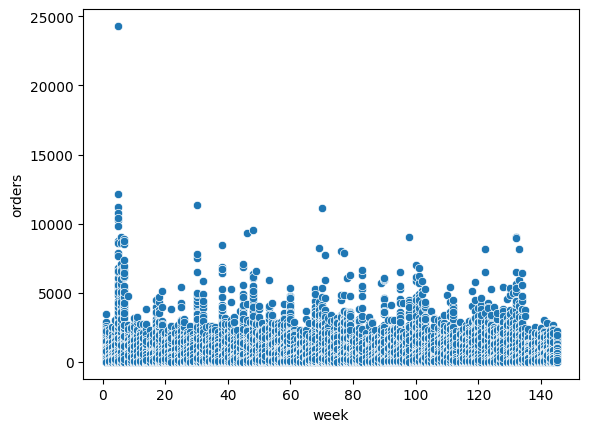

In [14]:
sns.scatterplot(data=deliveries, x='week', y='orders')

No weird values on object column. Hard to discern abnormal and deletable outlier on numeric column, although orders column has 1 very large value. Will investigate further in EDA section.

## Adding feature

In [15]:
deliveries['sales'] = deliveries['orders'] * deliveries['checkout_price']
deliveries['discount'] = (deliveries['checkout_price'] - deliveries['base_price'])/deliveries['base_price']*100

# EDA

## Descriptive Statistics and Univariate Analysis

In [16]:
deliveries.info()

<class 'pandas.core.frame.DataFrame'>
Index: 228274 entries, 114136 to 162455
Data columns (total 17 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   id              228274 non-null  int64  
 1   week            228274 non-null  int64  
 2   center_id       228274 non-null  int64  
 3   city_code       228274 non-null  int64  
 4   region_code     228274 non-null  int64  
 5   center_type     228274 non-null  object 
 6   op_area         228274 non-null  float64
 7   meal_id         228274 non-null  int64  
 8   category        228274 non-null  object 
 9   cuisine         228274 non-null  object 
 10  checkout_price  228274 non-null  float64
 11  base_price      228274 non-null  float64
 12  emailer         228274 non-null  int64  
 13  featured        228274 non-null  int64  
 14  orders          228274 non-null  int64  
 15  sales           228274 non-null  float64
 16  discount        228274 non-null  float64
dtypes: float64

In [17]:
deliveries.select_dtypes('object').describe()

,center_type,category,cuisine
count,228274,228274,228274
unique,3,14,4
top,A,Beverages,Italian
freq,131520,64152,61617


In [18]:
deliveries.select_dtypes('float64').describe().round(2)

,op_area,checkout_price,base_price,sales,discount
count,228274.00,228274.00,228274.00,228274.00,228274.00
mean,4.09,331.81,353.67,69943.87,-5.70
std,1.09,152.65,160.47,88975.62,11.35
min,0.90,2.97,55.35,41.58,-99.06
25%,3.60,228.92,243.50,17329.90,-5.61
50%,4.00,295.85,310.43,41773.91,-0.14
75%,4.50,442.38,456.93,89831.70,0.15
max,7.00,866.27,866.27,3865484.92,72.79


In [19]:
deliveries[col].astype('str').describe().round(2)

,center_id,category,meal_id,emailer,city_code,center_type,featured,cuisine,region_code
count,228274,228274,228274,228274,228274,228274,228274,228274,228274
unique,77,14,51,2,51,3,2,4,8
top,13,Beverages,1062,0,590,A,0,Italian,56
freq,3551,64152,5640,209740,27497,131520,203172,61617,95620


In [20]:
print("{:,}".format(deliveries['sales'].sum().round(2)))

15,966,367,729.89


In [21]:
print("{:,}".format(deliveries['orders'].sum().round(2)))

59,846,117


In [22]:
print(deliveries['sales'].sum()/deliveries['orders'].sum())

266.7903705413335


In [23]:
deliveries['cuisine'].unique()

array(['Italian', 'Thai', 'Indian', 'Continental'], dtype=object)

In [24]:
deliveries['category'].unique()

array(['Pasta', 'Beverages', 'Pizza', 'Other Snacks', 'Rice Bowl',
       'Desert', 'Starters', 'Seafood', 'Soup', 'Sandwich', 'Extras',
       'Biryani', 'Salad', 'Fish'], dtype=object)

In [25]:
deliveries['meal_id'].nunique()

51

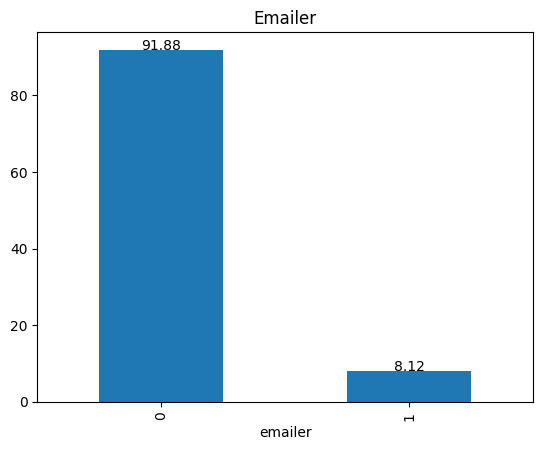

In [26]:
chart = deliveries['emailer'].value_counts(normalize=True)*100

chart.plot(kind='bar')
plt.title("Emailer")
for i in chart.index:
  plt.text(i, chart[i], round(chart[i],2), horizontalalignment='center')

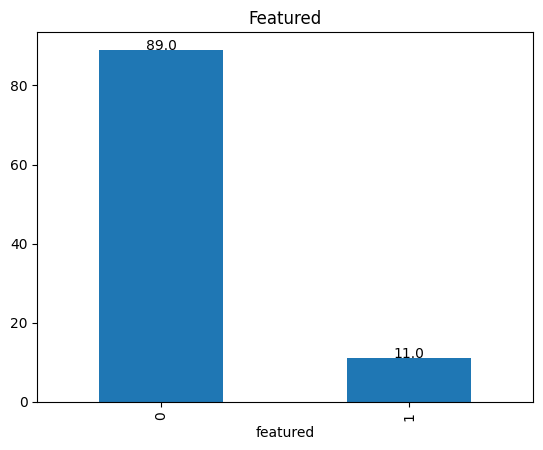

In [27]:
chart = deliveries['featured'].value_counts(normalize=True)*100

chart.plot(kind='bar')
plt.title("Featured")
for i in chart.index:
  plt.text(i, chart[i], round(chart[i],2), horizontalalignment='center')

## Popular food category per region

In [28]:
deliveries['category'].unique()

array(['Pasta', 'Beverages', 'Pizza', 'Other Snacks', 'Rice Bowl',
       'Desert', 'Starters', 'Seafood', 'Soup', 'Sandwich', 'Extras',
       'Biryani', 'Salad', 'Fish'], dtype=object)

C:\Users\Biyan Bahtiar\AppData\Local\Temp\ipykernel_8656\258162181.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  barplot = sns.barplot(data=temp_df_i, x='orders', y='category', ax=ax, palette=color_dict)


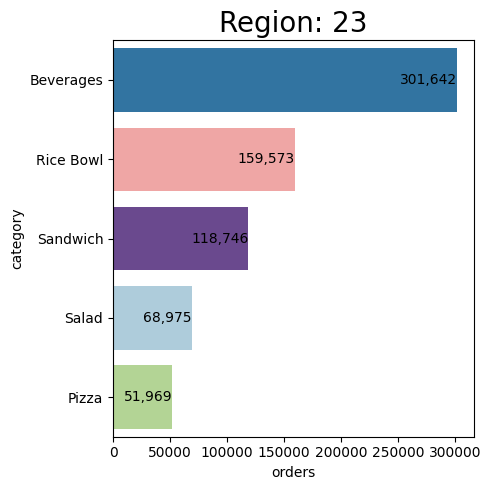

C:\Users\Biyan Bahtiar\AppData\Local\Temp\ipykernel_8656\258162181.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  barplot = sns.barplot(data=temp_df_i, x='orders', y='category', ax=ax, palette=color_dict)


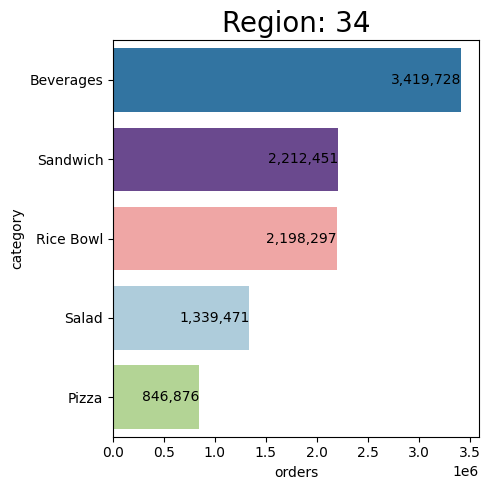

C:\Users\Biyan Bahtiar\AppData\Local\Temp\ipykernel_8656\258162181.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  barplot = sns.barplot(data=temp_df_i, x='orders', y='category', ax=ax, palette=color_dict)


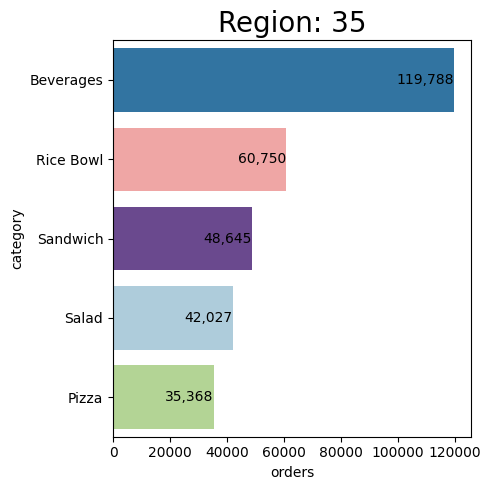

C:\Users\Biyan Bahtiar\AppData\Local\Temp\ipykernel_8656\258162181.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  barplot = sns.barplot(data=temp_df_i, x='orders', y='category', ax=ax, palette=color_dict)


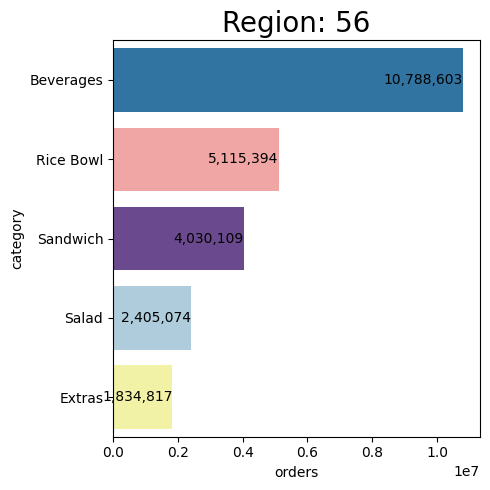

C:\Users\Biyan Bahtiar\AppData\Local\Temp\ipykernel_8656\258162181.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  barplot = sns.barplot(data=temp_df_i, x='orders', y='category', ax=ax, palette=color_dict)


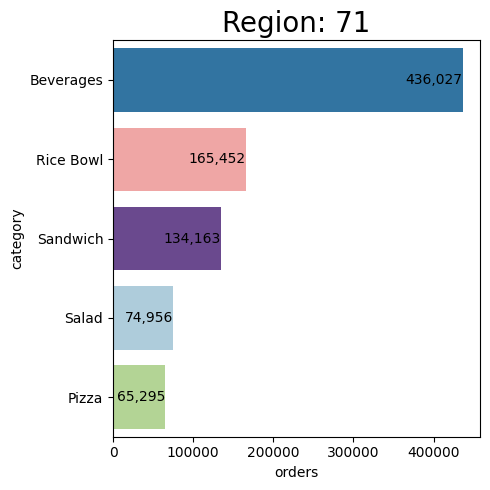

C:\Users\Biyan Bahtiar\AppData\Local\Temp\ipykernel_8656\258162181.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  barplot = sns.barplot(data=temp_df_i, x='orders', y='category', ax=ax, palette=color_dict)


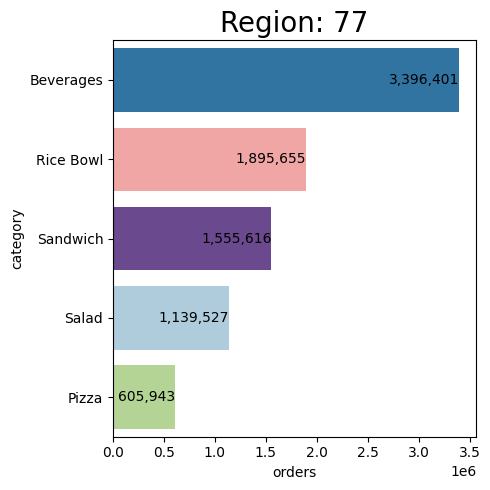

C:\Users\Biyan Bahtiar\AppData\Local\Temp\ipykernel_8656\258162181.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  barplot = sns.barplot(data=temp_df_i, x='orders', y='category', ax=ax, palette=color_dict)


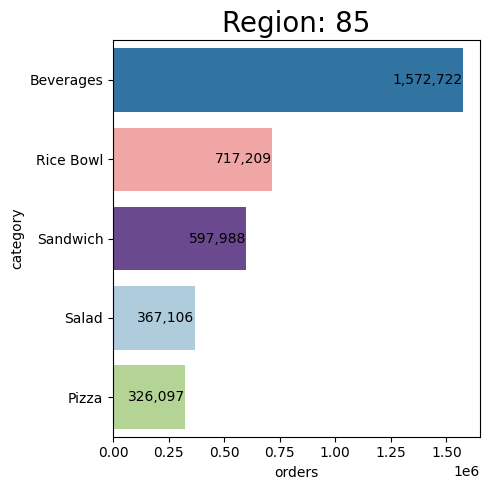

C:\Users\Biyan Bahtiar\AppData\Local\Temp\ipykernel_8656\258162181.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  barplot = sns.barplot(data=temp_df_i, x='orders', y='category', ax=ax, palette=color_dict)


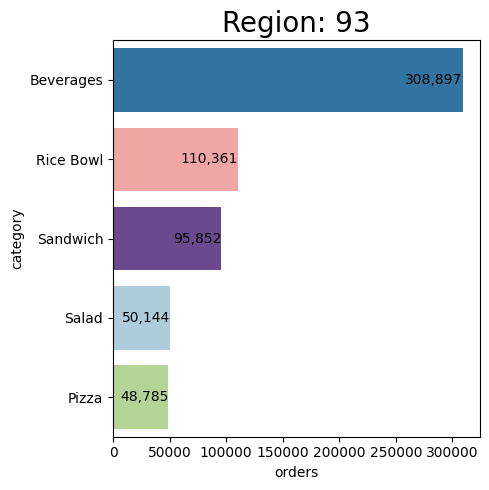

In [29]:
temp_df = deliveries.groupby(['region_code', 'category'],as_index=False).agg({'orders':'sum'})

food_categories = ['Pasta', 'Beverages', 'Pizza', 'Other Snacks', 'Rice Bowl', 
                   'Desert', 'Starters', 'Seafood', 'Soup', 'Sandwich', 
                   'Extras', 'Biryani', 'Salad', 'Fish']

palet = sns.color_palette('Paired', len(food_categories))
color_dict = dict(zip(food_categories, palet))

for i in temp_df['region_code'].unique():
    temp_df_i = temp_df[temp_df['region_code']==i].sort_values(by='orders', ascending=False).nlargest(n=5, columns='orders')
    fig, ax = plt.subplots(figsize=(5,5))
    plt.title(f"Region: {i}", fontsize=20)
    barplot = sns.barplot(data=temp_df_i, x='orders', y='category', ax=ax, palette=color_dict)
    # Add text labels inside the end of each bar
    for index, value in enumerate(temp_df_i['orders']):
        barplot.text(value - 10, index, f'{value:,.0f}', color='black', ha="right", va='center')
    plt.tight_layout()
    plt.show()

C:\Users\Biyan Bahtiar\AppData\Local\Temp\ipykernel_8656\2740560860.py:10: UserWarning: The palette list has more values (14) than needed (5), which may not be intended.
  sns.lineplot(data=temp_df_i, x='week', y='orders', hue='category', ax=ax, palette=palet, marker='o')


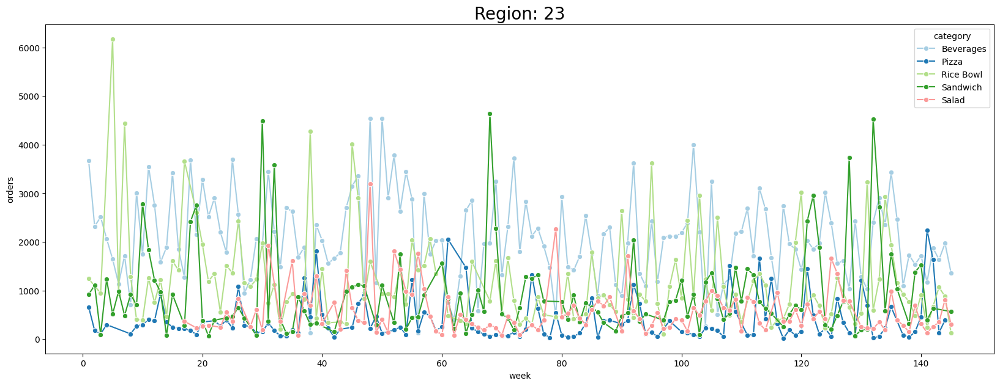

C:\Users\Biyan Bahtiar\AppData\Local\Temp\ipykernel_8656\2740560860.py:10: UserWarning: The palette list has more values (14) than needed (5), which may not be intended.
  sns.lineplot(data=temp_df_i, x='week', y='orders', hue='category', ax=ax, palette=palet, marker='o')


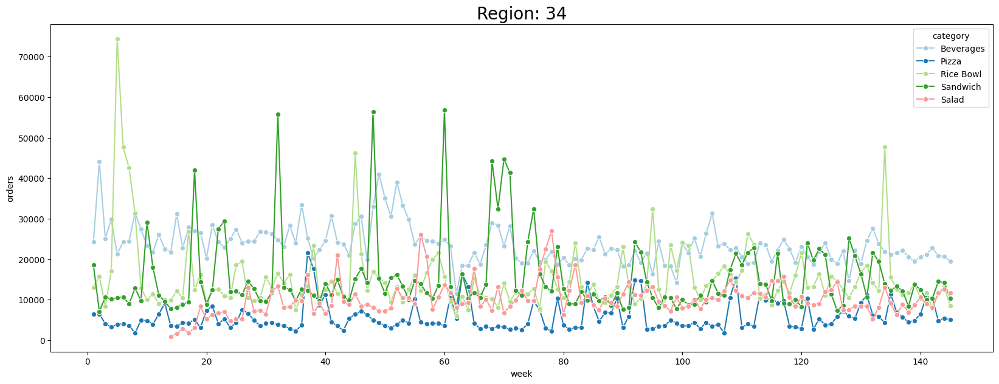

C:\Users\Biyan Bahtiar\AppData\Local\Temp\ipykernel_8656\2740560860.py:10: UserWarning: The palette list has more values (14) than needed (5), which may not be intended.
  sns.lineplot(data=temp_df_i, x='week', y='orders', hue='category', ax=ax, palette=palet, marker='o')


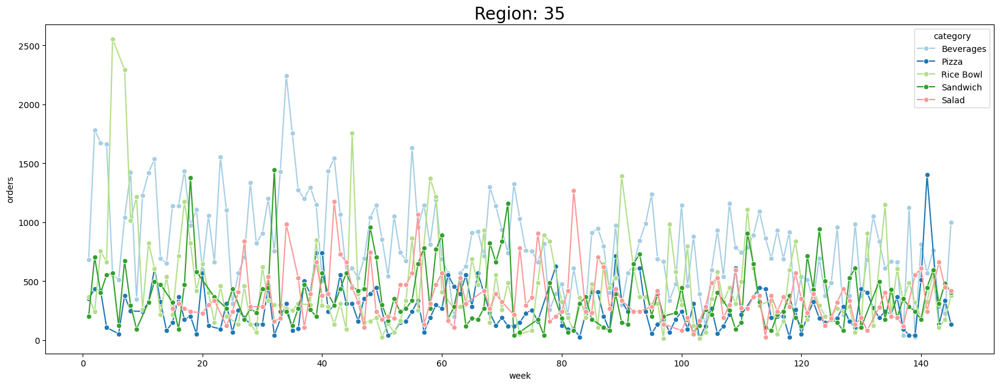

C:\Users\Biyan Bahtiar\AppData\Local\Temp\ipykernel_8656\2740560860.py:10: UserWarning: The palette list has more values (14) than needed (5), which may not be intended.
  sns.lineplot(data=temp_df_i, x='week', y='orders', hue='category', ax=ax, palette=palet, marker='o')


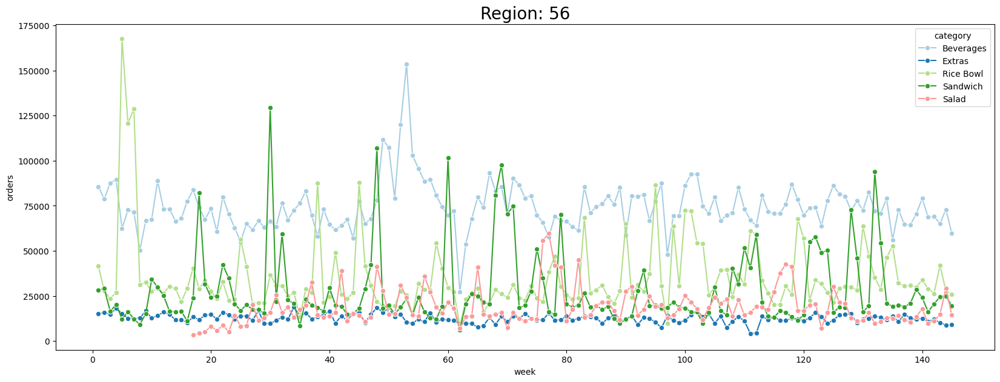

C:\Users\Biyan Bahtiar\AppData\Local\Temp\ipykernel_8656\2740560860.py:10: UserWarning: The palette list has more values (14) than needed (5), which may not be intended.
  sns.lineplot(data=temp_df_i, x='week', y='orders', hue='category', ax=ax, palette=palet, marker='o')


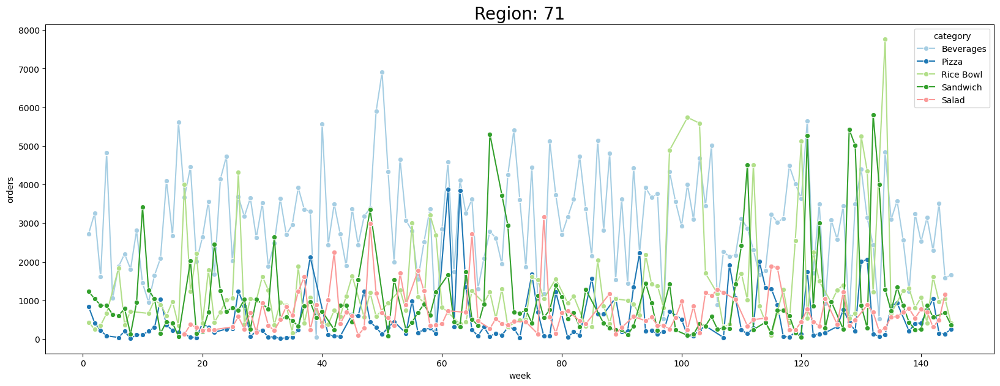

C:\Users\Biyan Bahtiar\AppData\Local\Temp\ipykernel_8656\2740560860.py:10: UserWarning: The palette list has more values (14) than needed (5), which may not be intended.
  sns.lineplot(data=temp_df_i, x='week', y='orders', hue='category', ax=ax, palette=palet, marker='o')


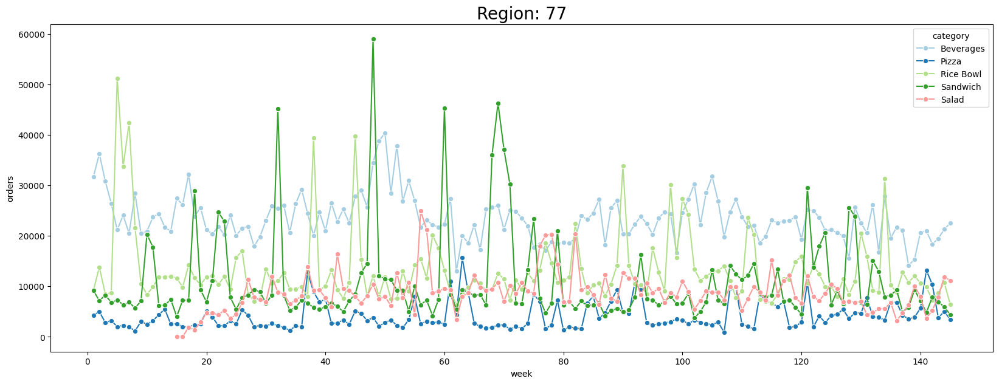

C:\Users\Biyan Bahtiar\AppData\Local\Temp\ipykernel_8656\2740560860.py:10: UserWarning: The palette list has more values (14) than needed (5), which may not be intended.
  sns.lineplot(data=temp_df_i, x='week', y='orders', hue='category', ax=ax, palette=palet, marker='o')


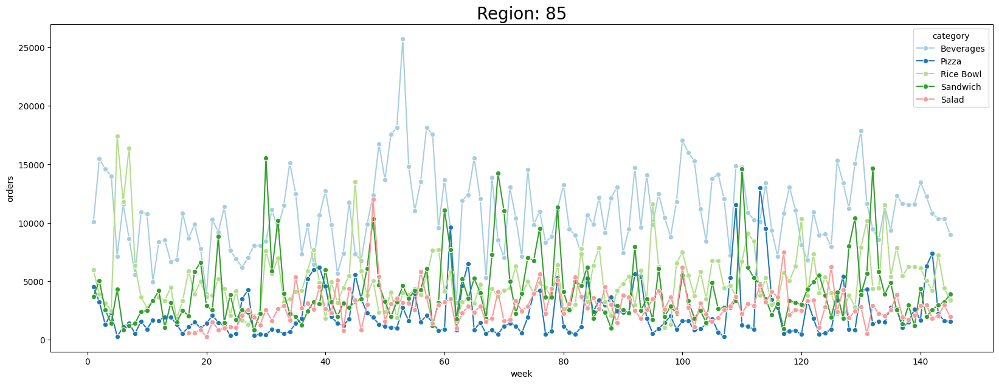

C:\Users\Biyan Bahtiar\AppData\Local\Temp\ipykernel_8656\2740560860.py:10: UserWarning: The palette list has more values (14) than needed (5), which may not be intended.
  sns.lineplot(data=temp_df_i, x='week', y='orders', hue='category', ax=ax, palette=palet, marker='o')


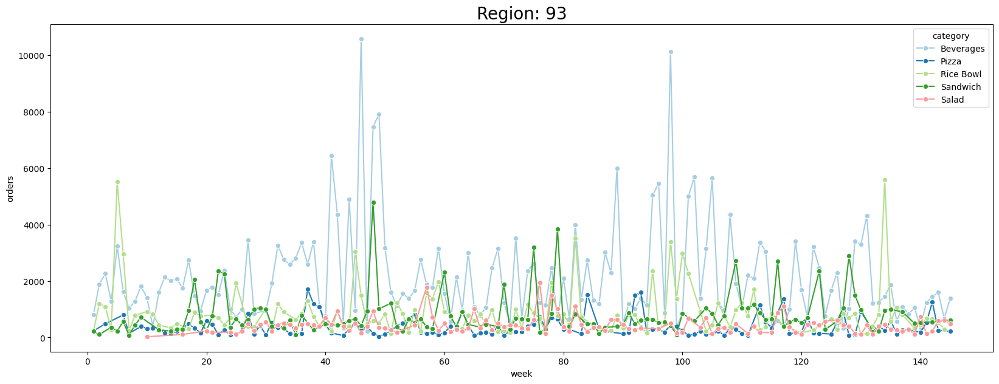

In [30]:
temp_df = deliveries.groupby(['week', 'region_code', 'category'],as_index=False).agg({'orders':'sum'})

for i in temp_df['region_code'].unique():
  temp_df_i = temp_df[temp_df['region_code']==i]
  top5 = temp_df_i.groupby('category', as_index=False).agg({'orders':'sum'}).nlargest(n=5, columns='orders')['category']

  temp_df_i = temp_df_i[temp_df_i['category'].isin(top5)]
  fig, ax = plt.subplots(figsize=(20,7))
  plt.title(f"Region: {i}", fontsize=20)
  sns.lineplot(data=temp_df_i, x='week', y='orders', hue='category', ax=ax, palette=palet, marker='o')

  plt.show()

# Analysis of fulfillment center capacity

### Which cities has > 3 fulfillment center

In [31]:
deliveries.info()

<class 'pandas.core.frame.DataFrame'>
Index: 228274 entries, 114136 to 162455
Data columns (total 17 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   id              228274 non-null  int64  
 1   week            228274 non-null  int64  
 2   center_id       228274 non-null  int64  
 3   city_code       228274 non-null  int64  
 4   region_code     228274 non-null  int64  
 5   center_type     228274 non-null  object 
 6   op_area         228274 non-null  float64
 7   meal_id         228274 non-null  int64  
 8   category        228274 non-null  object 
 9   cuisine         228274 non-null  object 
 10  checkout_price  228274 non-null  float64
 11  base_price      228274 non-null  float64
 12  emailer         228274 non-null  int64  
 13  featured        228274 non-null  int64  
 14  orders          228274 non-null  int64  
 15  sales           228274 non-null  float64
 16  discount        228274 non-null  float64
dtypes: float64

In [32]:
city_fulfil = deliveries.groupby('city_code', as_index=False)\
                        .agg({'center_id':pd.Series.nunique})\
                        .rename(columns={'center_id':'center_count'})
                                                            
city_fulfil_3_up = city_fulfil[city_fulfil['center_count']>3]

city_fulfil_3_up

,city_code,center_count
8,526,8
17,590,9


### What is the max of weekly order for each center type?

C:\Users\Biyan Bahtiar\AppData\Local\Temp\ipykernel_8656\3547227268.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=order_ctype, x='center_type', y='orders', palette='viridis', ax=ax)


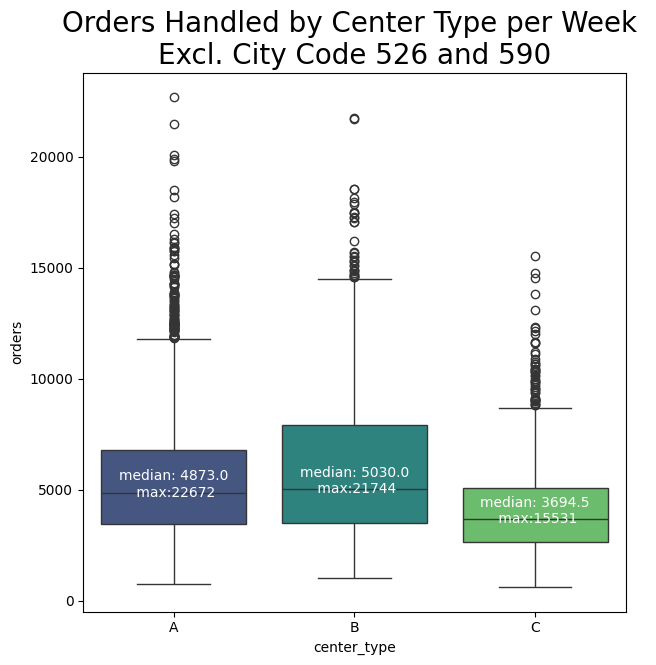

In [33]:
order_excl_526_590 = deliveries[~deliveries['city_code'].isin(city_fulfil_3_up['city_code'])]

order_ctype = order_excl_526_590.groupby(['center_type','center_id','week'], as_index=False).agg({'orders':'sum'})

fig, ax= plt.subplots(figsize=(7,7))
ax.set_title("Orders Handled by Center Type per Week \nExcl. City Code 526 and 590", fontsize=20)
sns.boxplot(data=order_ctype, x='center_type', y='orders', palette='viridis', ax=ax)

for i,v in enumerate(order_ctype['center_type'].unique()):
  y = order_ctype[order_ctype['center_type']==v]['orders'].values
  plt.text(i, np.median(y),
           f'median: {round(np.median(y),2)}\n max:{np.max(y)}\n',
           horizontalalignment='center',
           verticalalignment='center',
           color='white',
           fontsize=10)
ax.grid(False)
fig.savefig('fig_ctypearea.png', format='png', bbox_inches='tight', dpi=200)
plt.show()

C:\Users\Biyan Bahtiar\AppData\Local\Temp\ipykernel_8656\3323986161.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=order_ctype, x='center_type', y='orders', palette='viridis', ax=ax)


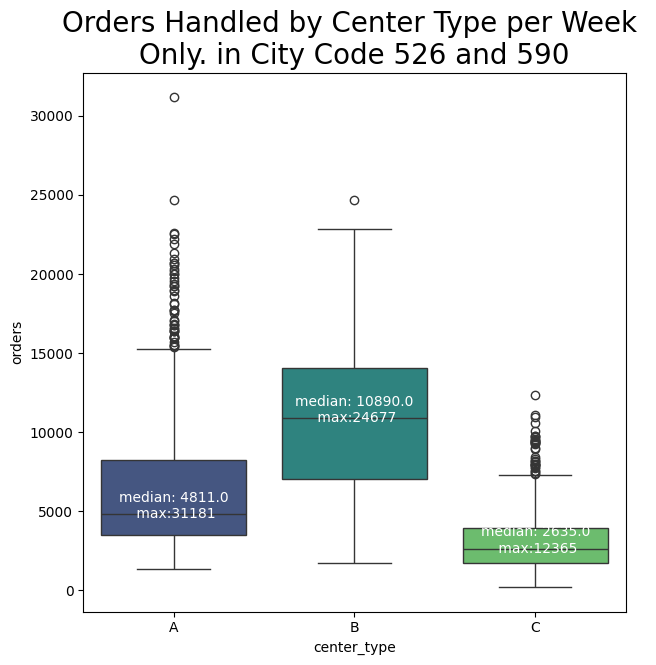

In [34]:
order_incl_526_590 = deliveries[deliveries['city_code'].isin(city_fulfil_3_up['city_code'])]

order_ctype = order_incl_526_590.groupby(['center_type','center_id','week'], as_index=False).agg({'orders':'sum'})

fig, ax= plt.subplots(figsize=(7,7))
ax.set_title("Orders Handled by Center Type per Week \nOnly. in City Code 526 and 590", fontsize=20)
sns.boxplot(data=order_ctype, x='center_type', y='orders', palette='viridis', ax=ax)

for i,v in enumerate(order_ctype['center_type'].unique()):
  y = order_ctype[order_ctype['center_type']==v]['orders'].values
  plt.text(i, np.median(y),
           f'median: {round(np.median(y),2)}\n max:{np.max(y)}\n',
           horizontalalignment='center',
           verticalalignment='center',
           color='white',
           fontsize=10)
ax.grid(False)
fig.savefig('fig_ctypearea.png', format='png', bbox_inches='tight', dpi=200)
plt.show()

Center Type B seems to be overburdened, since it handles approx. double order that other center with same type

### Dig deeper into center type B in city 526 and 590

C:\Users\Biyan Bahtiar\AppData\Local\Temp\ipykernel_8656\3246208316.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  order_526_590_B = deliveries[deliveries['city_code'].isin([526, 590])][deliveries['center_type']=='B']
C:\Users\Biyan Bahtiar\AppData\Local\Temp\ipykernel_8656\3246208316.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=order_526_590_B_group, x='city_code', y='orders', palette='viridis', ax=ax)


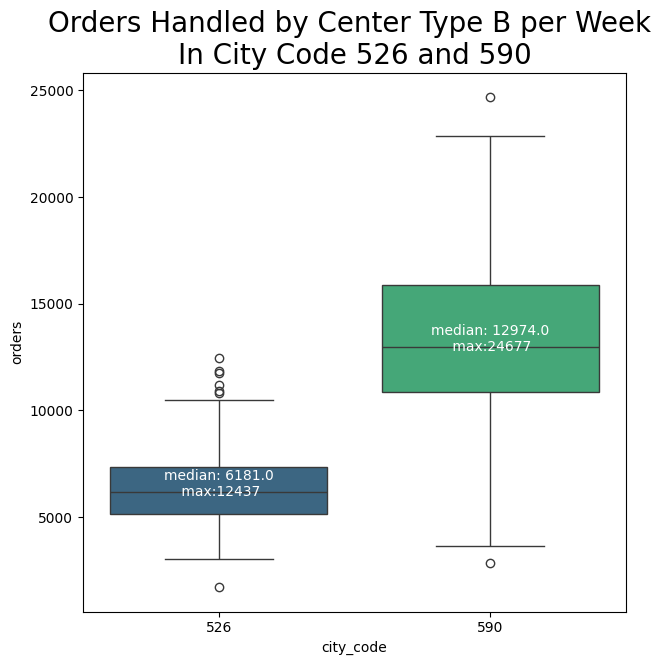

In [35]:
order_526_590_B = deliveries[deliveries['city_code'].isin([526, 590])][deliveries['center_type']=='B']

order_526_590_B_group = order_526_590_B.groupby(['city_code','center_id','week'], as_index=False).agg({'orders':'sum'})

fig, ax= plt.subplots(figsize=(7,7))
ax.set_title("Orders Handled by Center Type B per Week \nIn City Code 526 and 590", fontsize=20)
sns.boxplot(data=order_526_590_B_group, x='city_code', y='orders', palette='viridis', ax=ax)

for i,v in enumerate(order_526_590_B_group['city_code'].unique()):
  y = order_526_590_B_group[order_526_590_B_group['city_code']==v]['orders'].values
  plt.text(i, np.median(y),
           f'median: {round(np.median(y),2)}\n max:{np.max(y)}\n',
           horizontalalignment='center',
           verticalalignment='center',
           color='white',
           fontsize=10)
ax.grid(False)
fig.savefig('fig_orderctypeB526590.png', format='png', bbox_inches='tight', dpi=200)
plt.show()

### Dig deepr into city 590

C:\Users\Biyan Bahtiar\AppData\Local\Temp\ipykernel_8656\2946527706.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  order_590_B = deliveries[deliveries['city_code']==590][deliveries['center_type']=='B']
C:\Users\Biyan Bahtiar\AppData\Local\Temp\ipykernel_8656\2946527706.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=order_590_B_group, x='center_id', y='orders', palette='viridis', ax=ax)


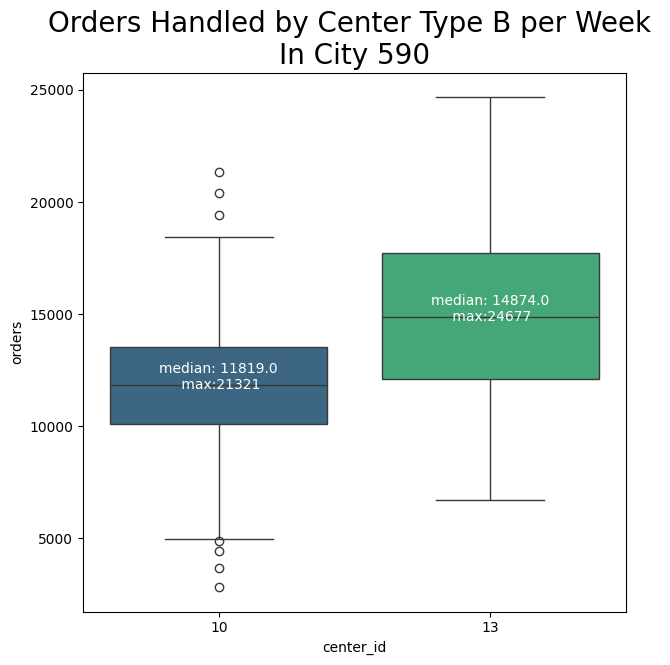

In [36]:
order_590_B = deliveries[deliveries['city_code']==590][deliveries['center_type']=='B']

order_590_B_group = order_590_B.groupby(['center_id','week'], as_index=False).agg({'orders':'sum'})

fig, ax= plt.subplots(figsize=(7,7))
ax.set_title("Orders Handled by Center Type B per Week \nIn City 590", fontsize=20)
sns.boxplot(data=order_590_B_group, x='center_id', y='orders', palette='viridis', ax=ax)

for i,v in enumerate(order_590_B_group['center_id'].unique()):
  y = order_590_B_group[order_590_B_group['center_id']==v]['orders'].values
  plt.text(i, np.median(y),
           f'median: {round(np.median(y),2)}\n max:{np.max(y)}\n',
           horizontalalignment='center',
           verticalalignment='center',
           color='white',
           fontsize=10)
ax.grid(False)
fig.savefig('fig_orderctypeB590_centerid.png', format='png', bbox_inches='tight', dpi=200)
plt.show()

### What is the order trend in city 590 and on each center type and id

C:\Users\Biyan Bahtiar\AppData\Local\Temp\ipykernel_8656\859772412.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df_i['MA'] = temp_df_i['orders'].rolling(16).mean()


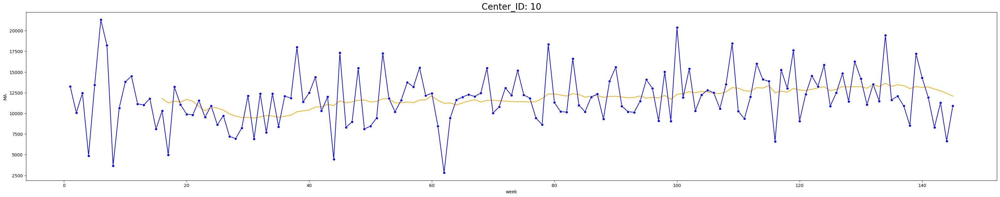

C:\Users\Biyan Bahtiar\AppData\Local\Temp\ipykernel_8656\859772412.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df_i['MA'] = temp_df_i['orders'].rolling(16).mean()


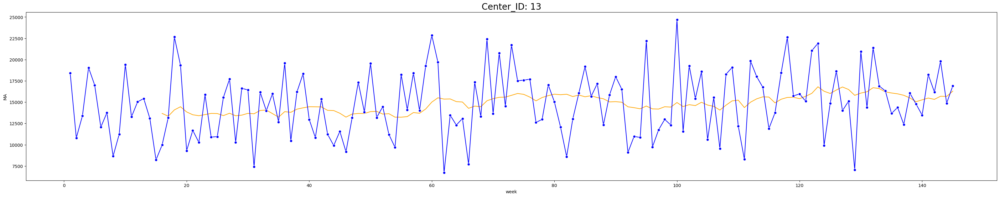

In [37]:
temp_df = order_590_B.groupby(['week', 'center_id'],as_index=False).agg({'orders':'sum'})

for i in temp_df['center_id'].unique():
  temp_df_i = temp_df[temp_df['center_id']==i]
  temp_df_i['MA'] = temp_df_i['orders'].rolling(16).mean()
  fig, ax = plt.subplots(figsize=(40,7))
  plt.title(f"Center_ID: {i}", fontsize=20)
  sns.lineplot(data=temp_df_i, x='week', y='MA', ax=ax, color='orange')
  sns.lineplot(data=temp_df_i, x='week', y='orders', ax=ax, color='blue', marker='o')

  # for i,v in zip(temp_df_i['week'], temp_df_i['sales']):
  #   plt.text(i, v, i)

  plt.show()

Order trend decrease in center id 10 for some last weeks, but stagnant in center id 10

### Is there any characteristic difference between center_type A, B and C

In [38]:
deliveries.info()

<class 'pandas.core.frame.DataFrame'>
Index: 228274 entries, 114136 to 162455
Data columns (total 17 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   id              228274 non-null  int64  
 1   week            228274 non-null  int64  
 2   center_id       228274 non-null  int64  
 3   city_code       228274 non-null  int64  
 4   region_code     228274 non-null  int64  
 5   center_type     228274 non-null  object 
 6   op_area         228274 non-null  float64
 7   meal_id         228274 non-null  int64  
 8   category        228274 non-null  object 
 9   cuisine         228274 non-null  object 
 10  checkout_price  228274 non-null  float64
 11  base_price      228274 non-null  float64
 12  emailer         228274 non-null  int64  
 13  featured        228274 non-null  int64  
 14  orders          228274 non-null  int64  
 15  sales           228274 non-null  float64
 16  discount        228274 non-null  float64
dtypes: float64

#### What is the average area handled by each center type?

In [39]:
area_cid = deliveries[['center_id', 'op_area']].sort_values(by='center_id')
area_cid

,center_id,op_area
180769,10,6.3
75671,10,6.3
84162,10,6.3
108645,10,6.3
141376,10,6.3
...,...,...
156453,186,3.4
36126,186,3.4
206626,186,3.4
160115,186,3.4


Each center_id has unique op_area

C:\Users\Biyan Bahtiar\AppData\Local\Temp\ipykernel_8656\2374970451.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=area_ctype, y='op_area', x='center_type', palette='viridis')


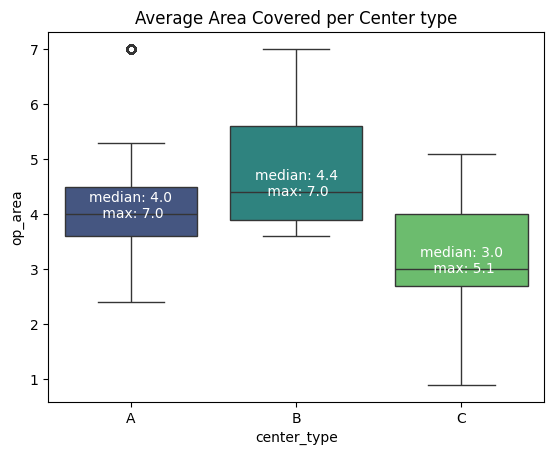

In [40]:
area_ctype = deliveries.groupby(['center_type', 'center_id', 'week'], as_index=False).agg({'op_area':'mean'}).sort_values(by='op_area', ascending=False)

sns.boxplot(data=area_ctype, y='op_area', x='center_type', palette='viridis')

for i,v in enumerate(area_ctype['center_type'].unique()):
  y = area_ctype[area_ctype['center_type']==v]['op_area'].values
  plt.text(i, np.median(y),
           f'median: {round(np.median(y),2)}\n max: {np.max(y)}\n',
           horizontalalignment='center',
           verticalalignment='center',
           color='white',
           fontsize=10)

plt.title('Average Area Covered per Center type')
plt.show()

B: cover the largest area and medium order
A: cover the medium area and largest order
C: cover the lowest area and lowest order

#### Are there any difference cuisine or category by center_type?

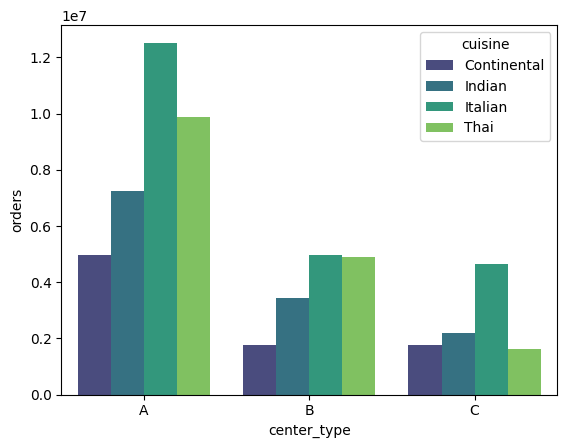

In [41]:
cuisine_ctype = deliveries.groupby(['center_type', 'cuisine'], as_index=False).agg({'orders':'sum'})

sns.barplot(data=cuisine_ctype, x='center_type', y='orders', hue='cuisine', palette='viridis')
plt.show()

No clear specialties for each center type

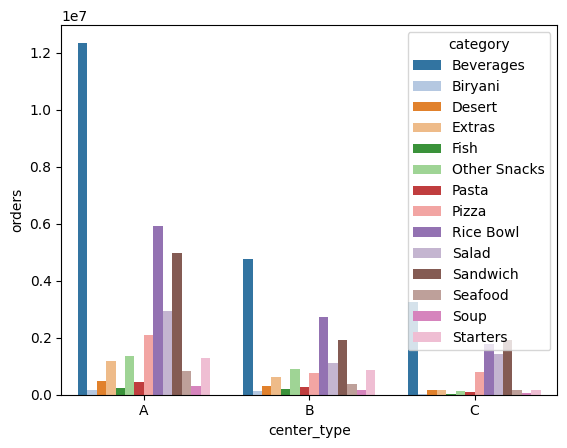

In [42]:
category_ctype = deliveries.groupby(['center_type', 'category'], as_index=False).agg({'orders':'sum'})

sns.barplot(data=category_ctype, x='center_type', y='orders', hue='category', palette='tab20')
plt.show()

No clear specialties

### o. Add 1 center type C close to center_id 13

### How is the performance of center type C in city 590, if it exist?

C:\Users\Biyan Bahtiar\AppData\Local\Temp\ipykernel_8656\2543736679.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  order_590_C = deliveries[deliveries['city_code']==590][deliveries['center_type']=='C']
C:\Users\Biyan Bahtiar\AppData\Local\Temp\ipykernel_8656\2543736679.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=order_590_C_group, x='center_id', y='orders', palette='viridis', ax=ax)


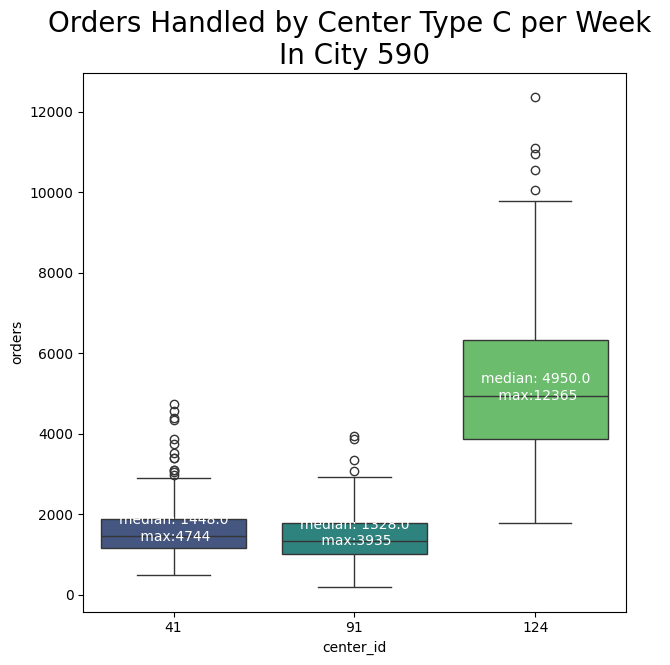

In [43]:
order_590_C = deliveries[deliveries['city_code']==590][deliveries['center_type']=='C']

order_590_C_group = order_590_C.groupby(['center_id','week'], as_index=False).agg({'orders':'sum'})

fig, ax= plt.subplots(figsize=(7,7))
ax.set_title("Orders Handled by Center Type C per Week \nIn City 590", fontsize=20)
sns.boxplot(data=order_590_C_group, x='center_id', y='orders', palette='viridis', ax=ax)

for i,v in enumerate(order_590_C_group['center_id'].unique()):
  y = order_590_C_group[order_590_C_group['center_id']==v]['orders'].values
  plt.text(i, np.median(y),
           f'median: {round(np.median(y),2)}\n max:{np.max(y)}\n',
           horizontalalignment='center',
           verticalalignment='center',
           color='white',
           fontsize=10)
ax.grid(False)
fig.savefig('fig_orderctypeC590_centerid.png', format='png', bbox_inches='tight', dpi=200)
plt.show()

C:\Users\Biyan Bahtiar\AppData\Local\Temp\ipykernel_8656\1336109474.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df_i['MA'] = temp_df_i['orders'].rolling(16).mean()


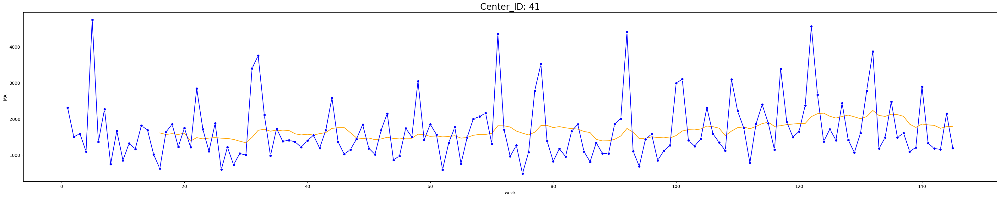

C:\Users\Biyan Bahtiar\AppData\Local\Temp\ipykernel_8656\1336109474.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df_i['MA'] = temp_df_i['orders'].rolling(16).mean()


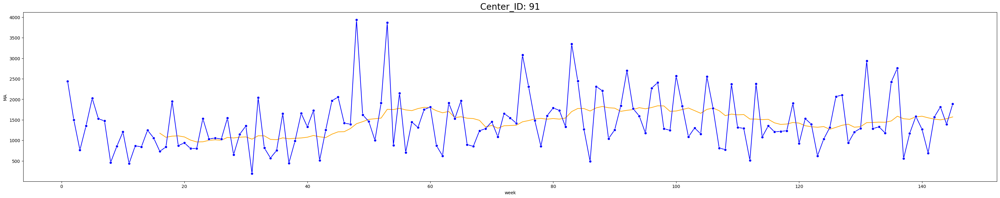

C:\Users\Biyan Bahtiar\AppData\Local\Temp\ipykernel_8656\1336109474.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df_i['MA'] = temp_df_i['orders'].rolling(16).mean()


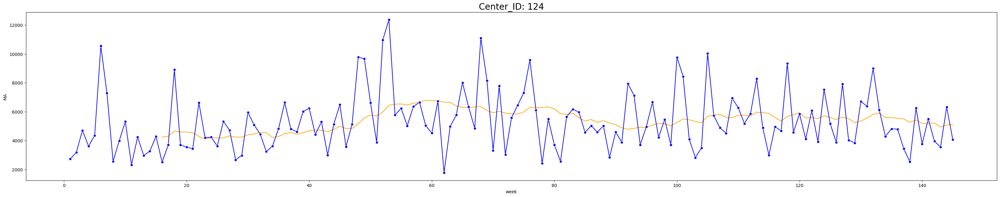

In [44]:
temp_df = order_590_C.groupby(['week', 'center_id'],as_index=False).agg({'orders':'sum'})

for i in temp_df['center_id'].unique():
  temp_df_i = temp_df[temp_df['center_id']==i]
  temp_df_i['MA'] = temp_df_i['orders'].rolling(16).mean()
  fig, ax = plt.subplots(figsize=(40,7))
  plt.title(f"Center_ID: {i}", fontsize=20)
  sns.lineplot(data=temp_df_i, x='week', y='MA', ax=ax, color='orange')
  sns.lineplot(data=temp_df_i, x='week', y='orders', ax=ax, color='blue', marker='o')

  # for i,v in zip(temp_df_i['week'], temp_df_i['sales']):
  #   plt.text(i, v, i)

  plt.show()

### o. Combine center 41 and 91

### How is the performance of center type A in city 590, if it exist?

C:\Users\Biyan Bahtiar\AppData\Local\Temp\ipykernel_8656\697253231.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  order_590_A = deliveries[deliveries['city_code']==590][deliveries['center_type']=='A']
C:\Users\Biyan Bahtiar\AppData\Local\Temp\ipykernel_8656\697253231.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=order_590_A_group, x='center_id', y='orders', palette='viridis', ax=ax)


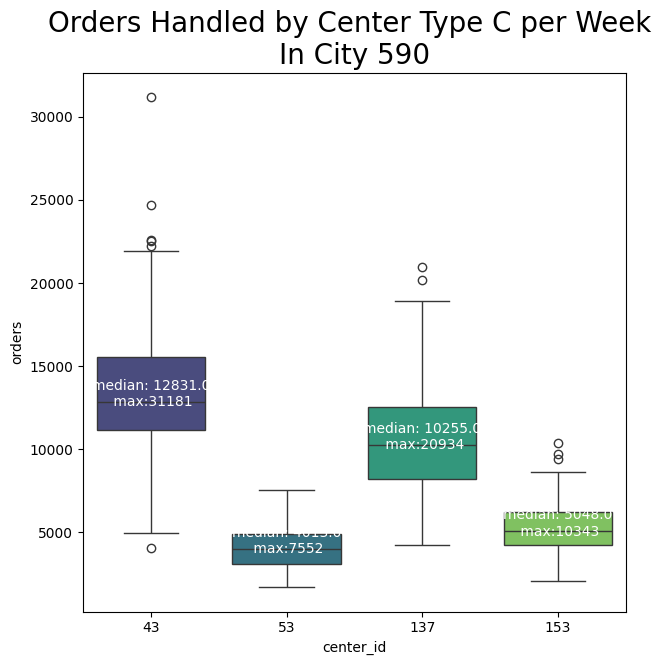

In [45]:
order_590_A = deliveries[deliveries['city_code']==590][deliveries['center_type']=='A']

order_590_A_group = order_590_A.groupby(['center_id','week'], as_index=False).agg({'orders':'sum'})

fig, ax= plt.subplots(figsize=(7,7))
ax.set_title("Orders Handled by Center Type C per Week \nIn City 590", fontsize=20)
sns.boxplot(data=order_590_A_group, x='center_id', y='orders', palette='viridis', ax=ax)

for i,v in enumerate(order_590_A_group['center_id'].unique()):
  y = order_590_A_group[order_590_A_group['center_id']==v]['orders'].values
  plt.text(i, np.median(y),
           f'median: {round(np.median(y),2)}\n max:{np.max(y)}\n',
           horizontalalignment='center',
           verticalalignment='center',
           color='white',
           fontsize=10)
ax.grid(False)
fig.savefig('fig_orderctypeC590_centerid.png', format='png', bbox_inches='tight', dpi=200)
plt.show()

C:\Users\Biyan Bahtiar\AppData\Local\Temp\ipykernel_8656\4194159723.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df_i['MA'] = temp_df_i['orders'].rolling(16).mean()


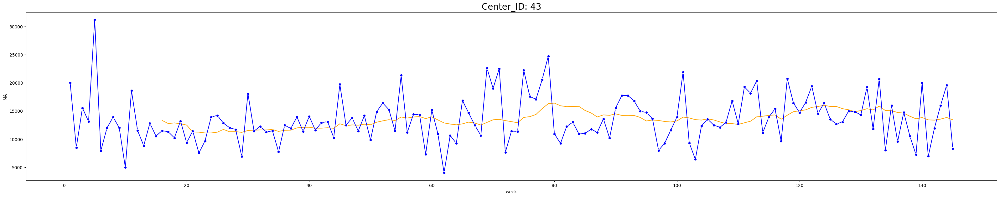

C:\Users\Biyan Bahtiar\AppData\Local\Temp\ipykernel_8656\4194159723.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df_i['MA'] = temp_df_i['orders'].rolling(16).mean()


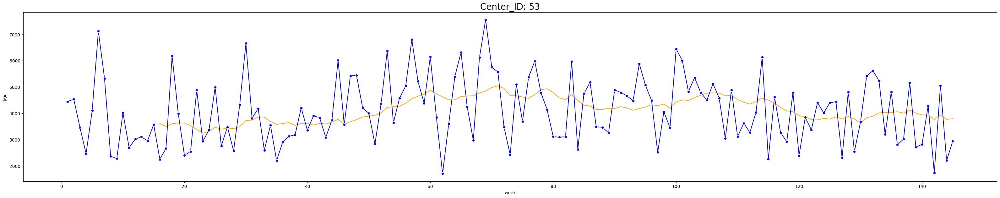

C:\Users\Biyan Bahtiar\AppData\Local\Temp\ipykernel_8656\4194159723.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df_i['MA'] = temp_df_i['orders'].rolling(16).mean()


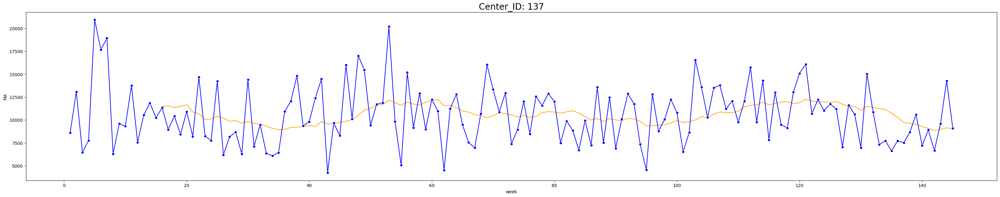

C:\Users\Biyan Bahtiar\AppData\Local\Temp\ipykernel_8656\4194159723.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df_i['MA'] = temp_df_i['orders'].rolling(16).mean()


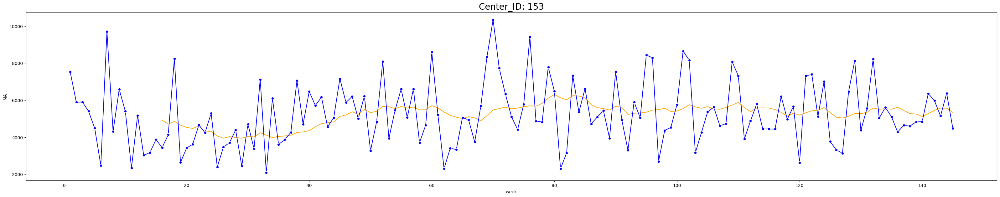

In [46]:
temp_df = order_590_A.groupby(['week', 'center_id'],as_index=False).agg({'orders':'sum'})

for i in temp_df['center_id'].unique():
  temp_df_i = temp_df[temp_df['center_id']==i]
  temp_df_i['MA'] = temp_df_i['orders'].rolling(16).mean()
  fig, ax = plt.subplots(figsize=(40,7))
  plt.title(f"Center_ID: {i}", fontsize=20)
  sns.lineplot(data=temp_df_i, x='week', y='MA', ax=ax, color='orange')
  sns.lineplot(data=temp_df_i, x='week', y='orders', ax=ax, color='blue', marker='o')

  # for i,v in zip(temp_df_i['week'], temp_df_i['sales']):
  #   plt.text(i, v, i)

  plt.show()

### o. Combine center 53 and 153

### city 526 center type B

C:\Users\Biyan Bahtiar\AppData\Local\Temp\ipykernel_8656\3181903949.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  order_526_B = deliveries[deliveries['city_code']==526][deliveries['center_type']=='B']
C:\Users\Biyan Bahtiar\AppData\Local\Temp\ipykernel_8656\3181903949.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=order_526_B_group, x='center_id', y='orders', palette='viridis', ax=ax)


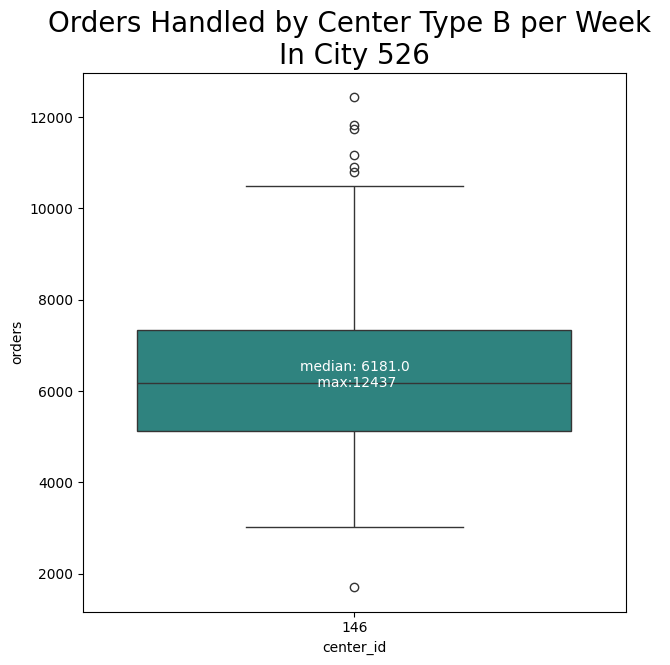

In [47]:
order_526_B = deliveries[deliveries['city_code']==526][deliveries['center_type']=='B']

order_526_B_group = order_526_B.groupby(['center_id','week'], as_index=False).agg({'orders':'sum'})

fig, ax= plt.subplots(figsize=(7,7))
ax.set_title("Orders Handled by Center Type B per Week \nIn City 526", fontsize=20)
sns.boxplot(data=order_526_B_group, x='center_id', y='orders', palette='viridis', ax=ax)

for i,v in enumerate(order_526_B_group['center_id'].unique()):
  y = order_526_B_group[order_526_B_group['center_id']==v]['orders'].values
  plt.text(i, np.median(y),
           f'median: {round(np.median(y),2)}\n max:{np.max(y)}\n',
           horizontalalignment='center',
           verticalalignment='center',
           color='white',
           fontsize=10)
ax.grid(False)
fig.savefig('fig_orderctypeB590_centerid.png', format='png', bbox_inches='tight', dpi=200)
plt.show()

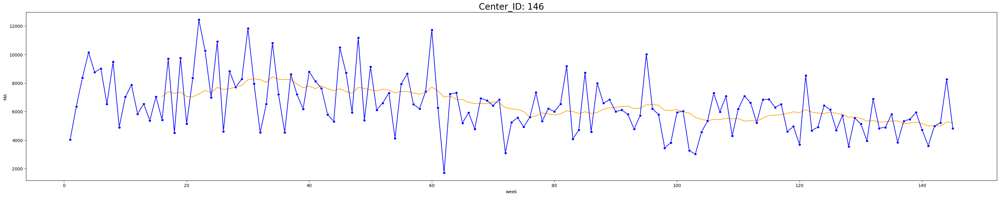

In [48]:
temp_df = order_526_B.groupby(['week', 'center_id'],as_index=False).agg({'orders':'sum'})

for i in temp_df['center_id'].unique():
  temp_df_i = temp_df[temp_df['center_id']==i]
  temp_df_i['MA'] = temp_df_i['orders'].rolling(16).mean()
  fig, ax = plt.subplots(figsize=(40,7))
  plt.title(f"Center_ID: {i}", fontsize=20)
  sns.lineplot(data=temp_df_i, x='week', y='MA', ax=ax, color='orange')
  sns.lineplot(data=temp_df_i, x='week', y='orders', ax=ax, color='blue', marker='o')

  # for i,v in zip(temp_df_i['week'], temp_df_i['sales']):
  #   plt.text(i, v, i)

  plt.show()

### o. Observe order center ID 146

### city 526 center type A

C:\Users\Biyan Bahtiar\AppData\Local\Temp\ipykernel_8656\390241626.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  order_526_A = deliveries[deliveries['city_code']==526][deliveries['center_type']=='A']
C:\Users\Biyan Bahtiar\AppData\Local\Temp\ipykernel_8656\390241626.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=order_526_A_group, x='center_id', y='orders', palette='viridis', ax=ax)


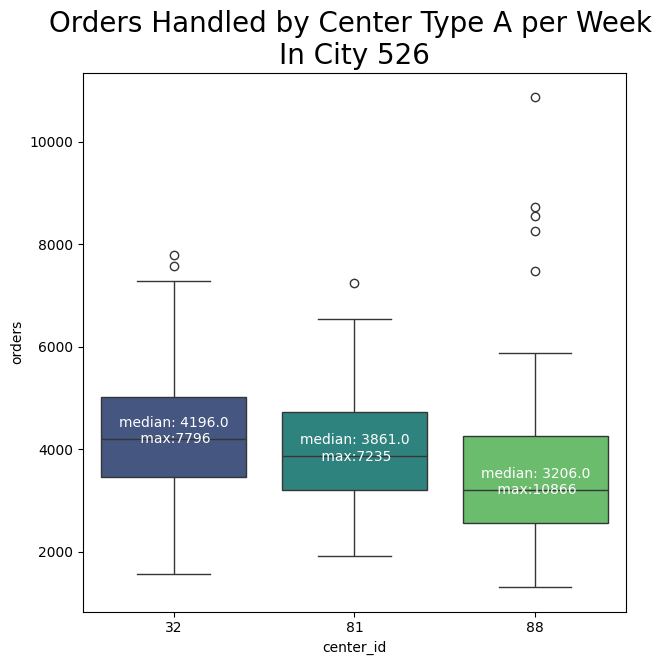

In [49]:
order_526_A = deliveries[deliveries['city_code']==526][deliveries['center_type']=='A']

order_526_A_group = order_526_A.groupby(['center_id','week'], as_index=False).agg({'orders':'sum'})

fig, ax= plt.subplots(figsize=(7,7))
ax.set_title("Orders Handled by Center Type A per Week \nIn City 526", fontsize=20)
sns.boxplot(data=order_526_A_group, x='center_id', y='orders', palette='viridis', ax=ax)

for i,v in enumerate(order_526_A_group['center_id'].unique()):
  y = order_526_A_group[order_526_A_group['center_id']==v]['orders'].values
  plt.text(i, np.median(y),
           f'median: {round(np.median(y),2)}\n max:{np.max(y)}\n',
           horizontalalignment='center',
           verticalalignment='center',
           color='white',
           fontsize=10)
ax.grid(False)
fig.savefig('fig_orderctypeB590_centerid.png', format='png', bbox_inches='tight', dpi=200)
plt.show()

C:\Users\Biyan Bahtiar\AppData\Local\Temp\ipykernel_8656\3061592887.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df_i['MA'] = temp_df_i['orders'].rolling(16).mean()


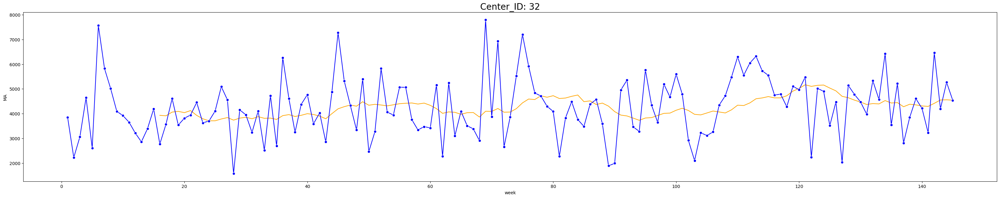

C:\Users\Biyan Bahtiar\AppData\Local\Temp\ipykernel_8656\3061592887.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df_i['MA'] = temp_df_i['orders'].rolling(16).mean()


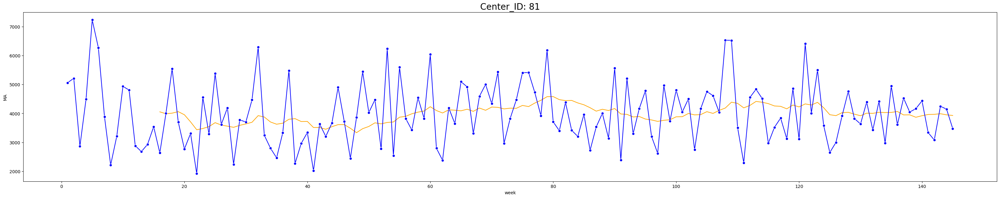

C:\Users\Biyan Bahtiar\AppData\Local\Temp\ipykernel_8656\3061592887.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df_i['MA'] = temp_df_i['orders'].rolling(16).mean()


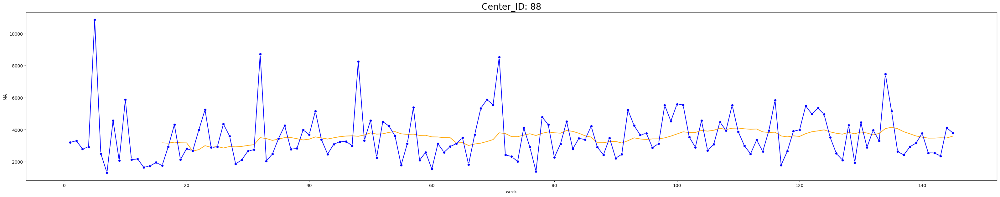

In [50]:
temp_df = order_526_A.groupby(['week', 'center_id'],as_index=False).agg({'orders':'sum'})

for i in temp_df['center_id'].unique():
  temp_df_i = temp_df[temp_df['center_id']==i]
  temp_df_i['MA'] = temp_df_i['orders'].rolling(16).mean()
  fig, ax = plt.subplots(figsize=(40,7))
  plt.title(f"Center_ID: {i}", fontsize=20)
  sns.lineplot(data=temp_df_i, x='week', y='MA', ax=ax, color='orange')
  sns.lineplot(data=temp_df_i, x='week', y='orders', ax=ax, color='blue', marker='o')

  # for i,v in zip(temp_df_i['week'], temp_df_i['sales']):
  #   plt.text(i, v, i)

  plt.show()

### city 526 center type C

C:\Users\Biyan Bahtiar\AppData\Local\Temp\ipykernel_8656\4058541067.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  order_526_C = deliveries[deliveries['city_code']==526][deliveries['center_type']=='C']
C:\Users\Biyan Bahtiar\AppData\Local\Temp\ipykernel_8656\4058541067.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=order_526_C_group, x='center_id', y='orders', palette='viridis', ax=ax)


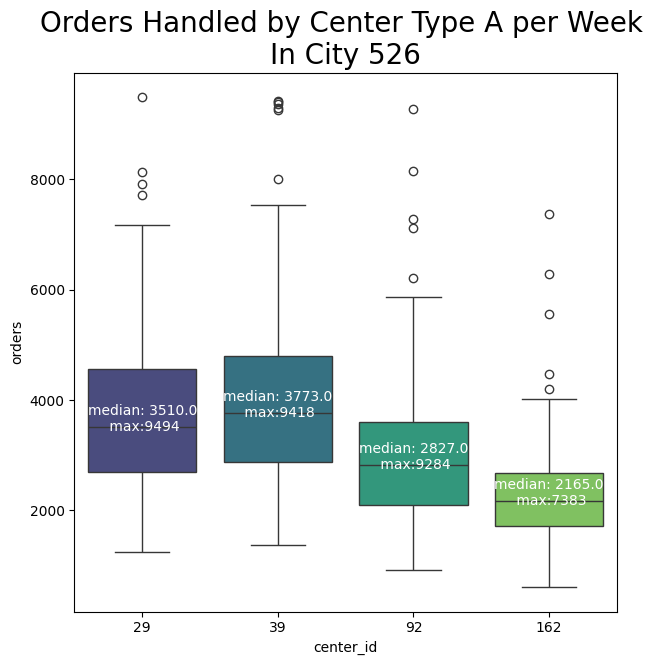

In [51]:
order_526_C = deliveries[deliveries['city_code']==526][deliveries['center_type']=='C']

order_526_C_group = order_526_C.groupby(['center_id','week'], as_index=False).agg({'orders':'sum'})

fig, ax= plt.subplots(figsize=(7,7))
ax.set_title("Orders Handled by Center Type A per Week \nIn City 526", fontsize=20)
sns.boxplot(data=order_526_C_group, x='center_id', y='orders', palette='viridis', ax=ax)

for i,v in enumerate(order_526_C_group['center_id'].unique()):
  y = order_526_C_group[order_526_C_group['center_id']==v]['orders'].values
  plt.text(i, np.median(y),
           f'median: {round(np.median(y),2)}\n max:{np.max(y)}\n',
           horizontalalignment='center',
           verticalalignment='center',
           color='white',
           fontsize=10)
ax.grid(False)
fig.savefig('fig_orderctypeB590_centerid.png', format='png', bbox_inches='tight', dpi=200)
plt.show()

C:\Users\Biyan Bahtiar\AppData\Local\Temp\ipykernel_8656\3576341258.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df_i['MA'] = temp_df_i['orders'].rolling(16).mean()


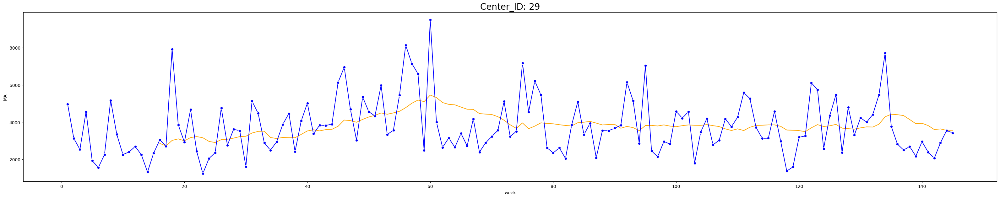

C:\Users\Biyan Bahtiar\AppData\Local\Temp\ipykernel_8656\3576341258.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df_i['MA'] = temp_df_i['orders'].rolling(16).mean()


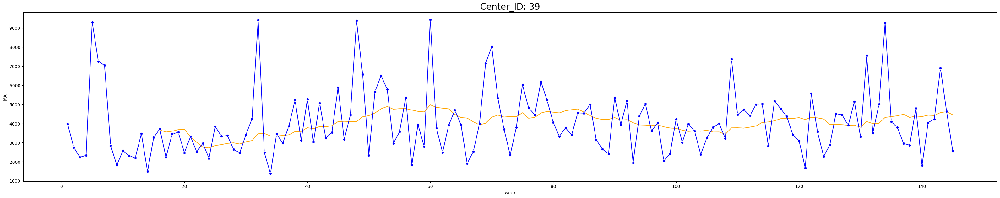

C:\Users\Biyan Bahtiar\AppData\Local\Temp\ipykernel_8656\3576341258.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df_i['MA'] = temp_df_i['orders'].rolling(16).mean()


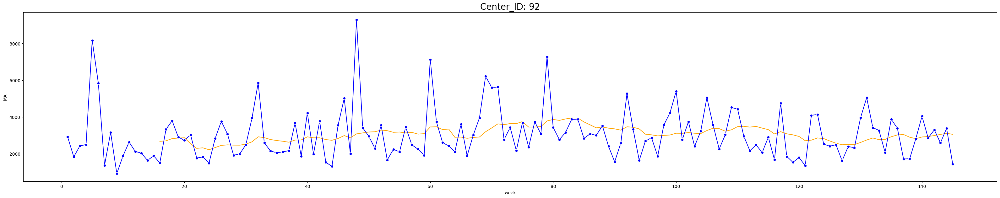

C:\Users\Biyan Bahtiar\AppData\Local\Temp\ipykernel_8656\3576341258.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df_i['MA'] = temp_df_i['orders'].rolling(16).mean()


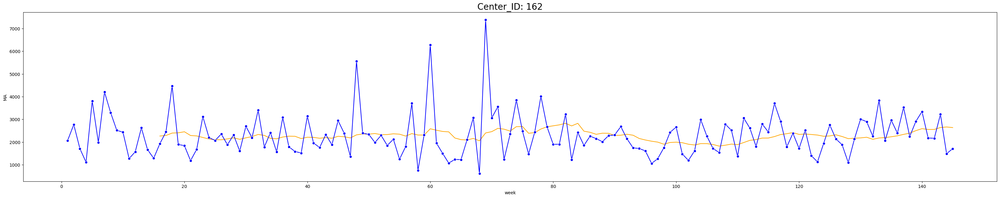

In [52]:
temp_df = order_526_C.groupby(['week', 'center_id'],as_index=False).agg({'orders':'sum'})

for i in temp_df['center_id'].unique():
  temp_df_i = temp_df[temp_df['center_id']==i]
  temp_df_i['MA'] = temp_df_i['orders'].rolling(16).mean()
  fig, ax = plt.subplots(figsize=(40,7))
  plt.title(f"Center_ID: {i}", fontsize=20)
  sns.lineplot(data=temp_df_i, x='week', y='MA', ax=ax, color='orange')
  sns.lineplot(data=temp_df_i, x='week', y='orders', ax=ax, color='blue', marker='o')

  # for i,v in zip(temp_df_i['week'], temp_df_i['sales']):
  #   plt.text(i, v, i)

  plt.show()

# Promo Analysis

In [53]:
deliveries.info()

<class 'pandas.core.frame.DataFrame'>
Index: 228274 entries, 114136 to 162455
Data columns (total 17 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   id              228274 non-null  int64  
 1   week            228274 non-null  int64  
 2   center_id       228274 non-null  int64  
 3   city_code       228274 non-null  int64  
 4   region_code     228274 non-null  int64  
 5   center_type     228274 non-null  object 
 6   op_area         228274 non-null  float64
 7   meal_id         228274 non-null  int64  
 8   category        228274 non-null  object 
 9   cuisine         228274 non-null  object 
 10  checkout_price  228274 non-null  float64
 11  base_price      228274 non-null  float64
 12  emailer         228274 non-null  int64  
 13  featured        228274 non-null  int64  
 14  orders          228274 non-null  int64  
 15  sales           228274 non-null  float64
 16  discount        228274 non-null  float64
dtypes: float64

### If promo is given on certain week, did everyone buy in that period get the promo?

In [54]:
tes = deliveries[deliveries['meal_id']==1109].groupby(['week','meal_id'], as_index=False).agg({'emailer':'mean'})
tes[(tes['emailer']>0)&(tes['emailer']<1)]

,week,meal_id,emailer
0,1,1109,0.534884
1,2,1109,0.619048
29,30,1109,0.500000
40,41,1109,0.931818
46,47,1109,0.542857


In [55]:
tes = deliveries[deliveries['meal_id']==1109].groupby(['week','meal_id'], as_index=False).agg({'featured':'mean'})
tes[(tes['featured']>0)&(tes['featured']<1)]

,week,meal_id,featured
0,1,1109,0.023256
1,2,1109,0.309524
2,3,1109,0.083333
3,4,1109,0.025641
7,8,1109,0.026316
...,...,...,...
137,138,1109,0.026316
138,139,1109,0.027027
140,141,1109,0.025641
141,142,1109,0.027027


### Is the promo given by region or city?

In [56]:
deliveries.columns

Index(['id', 'week', 'center_id', 'city_code', 'region_code', 'center_type',
       'op_area', 'meal_id', 'category', 'cuisine', 'checkout_price',
       'base_price', 'emailer', 'featured', 'orders', 'sales', 'discount'],
      dtype='object')

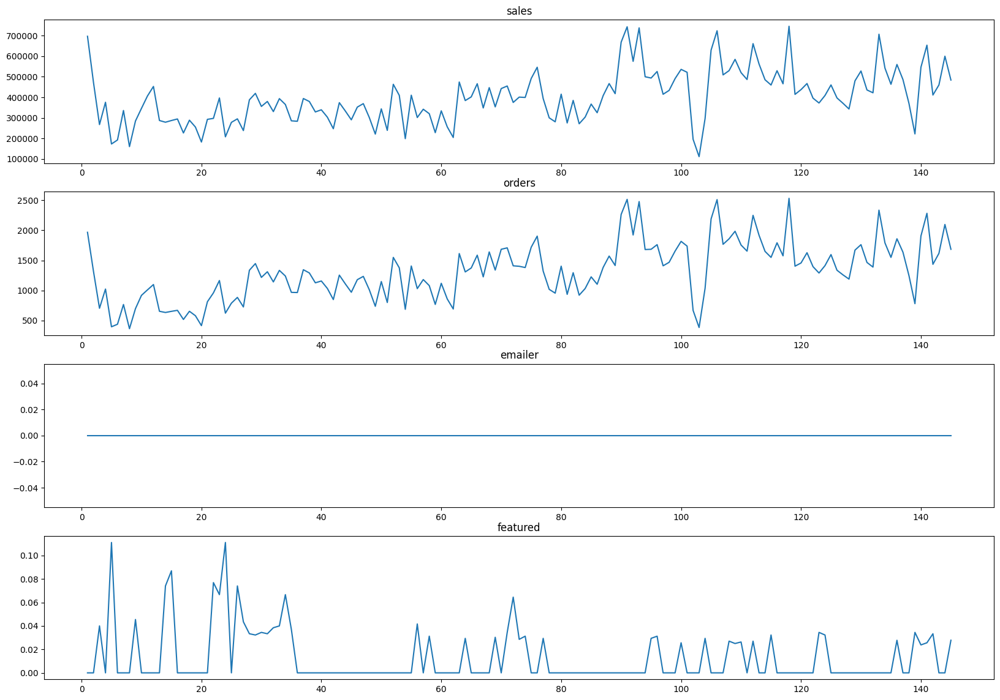

In [57]:
deliveries_meal_specified = deliveries[deliveries['meal_id']==2139]

weekly_meal_specified = deliveries_meal_specified.groupby('week',as_index=False).agg({'orders':'sum', 'sales':'sum', 'emailer':'mean', 'featured':'mean'})

fig, ax = plt.subplots(figsize=(20,14), nrows = 4, ncols = 1)
ax[0].plot(weekly_meal_specified['week'], weekly_meal_specified['sales'])
ax[0].set_title('sales')
ax[1].plot(weekly_meal_specified['week'], weekly_meal_specified['orders'])
ax[1].set_title('orders')
ax[2].plot(weekly_meal_specified['week'], weekly_meal_specified['emailer'])
ax[2].set_title('emailer')
ax[3].plot(weekly_meal_specified['week'], weekly_meal_specified['featured'])
ax[3].set_title('featured')

plt.show()

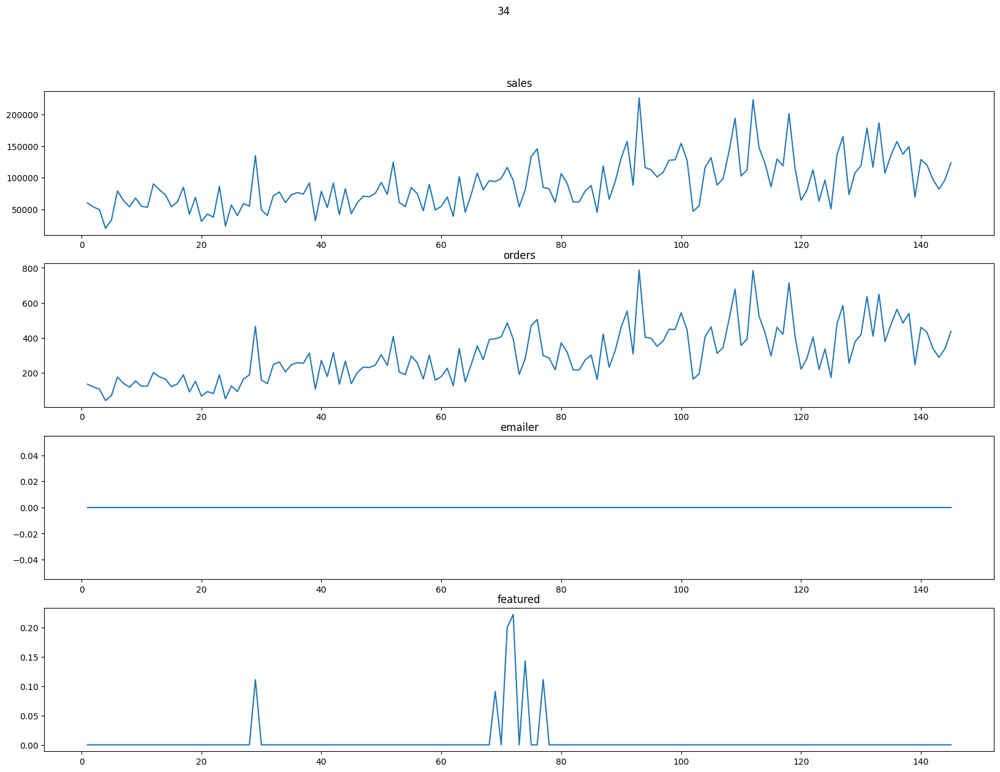

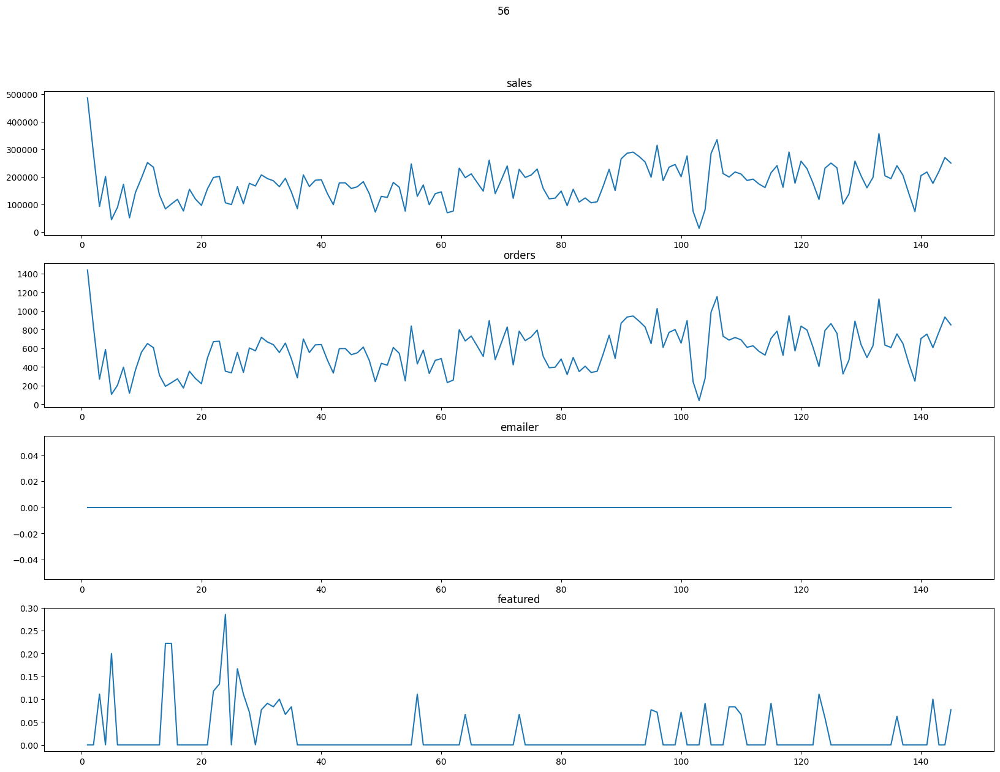

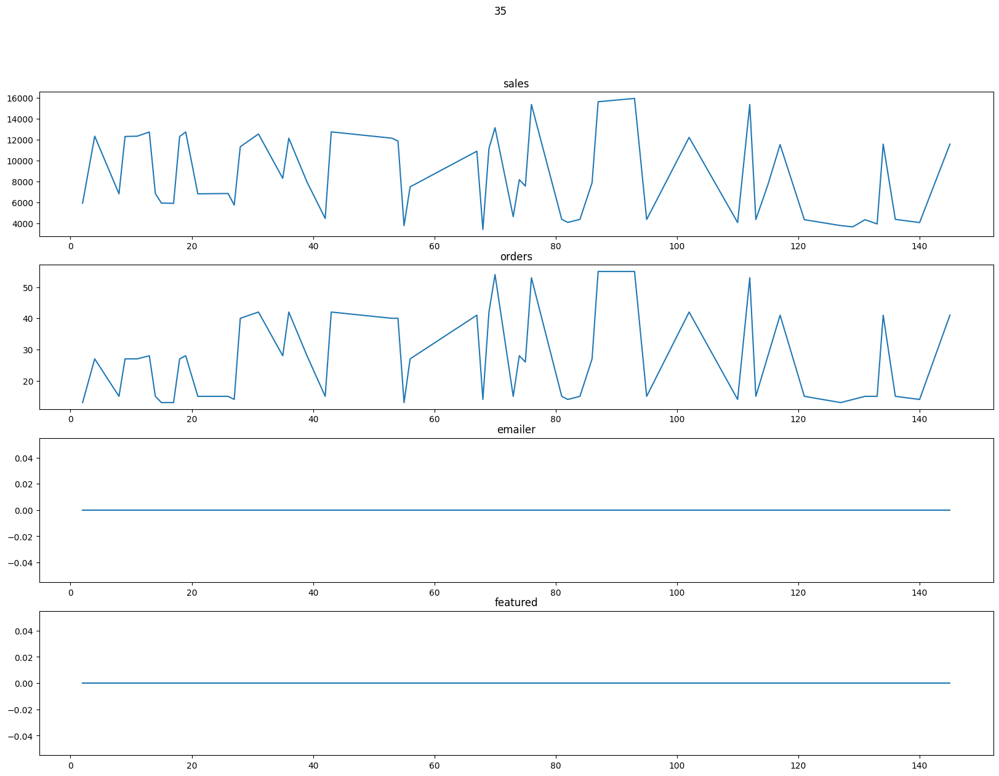

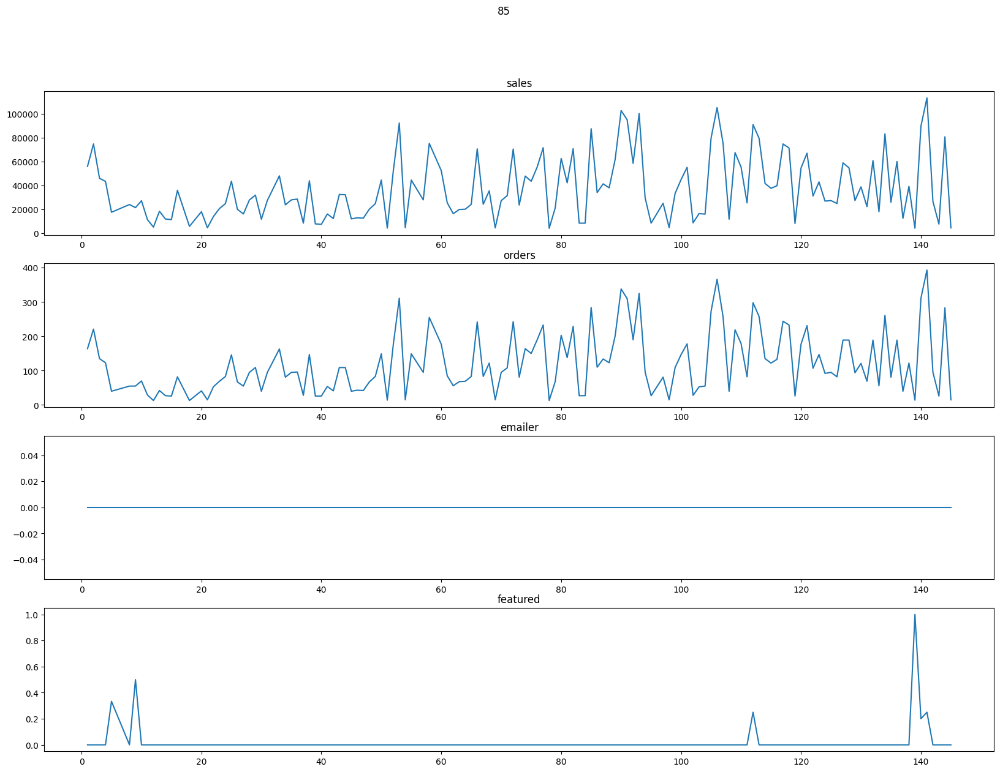

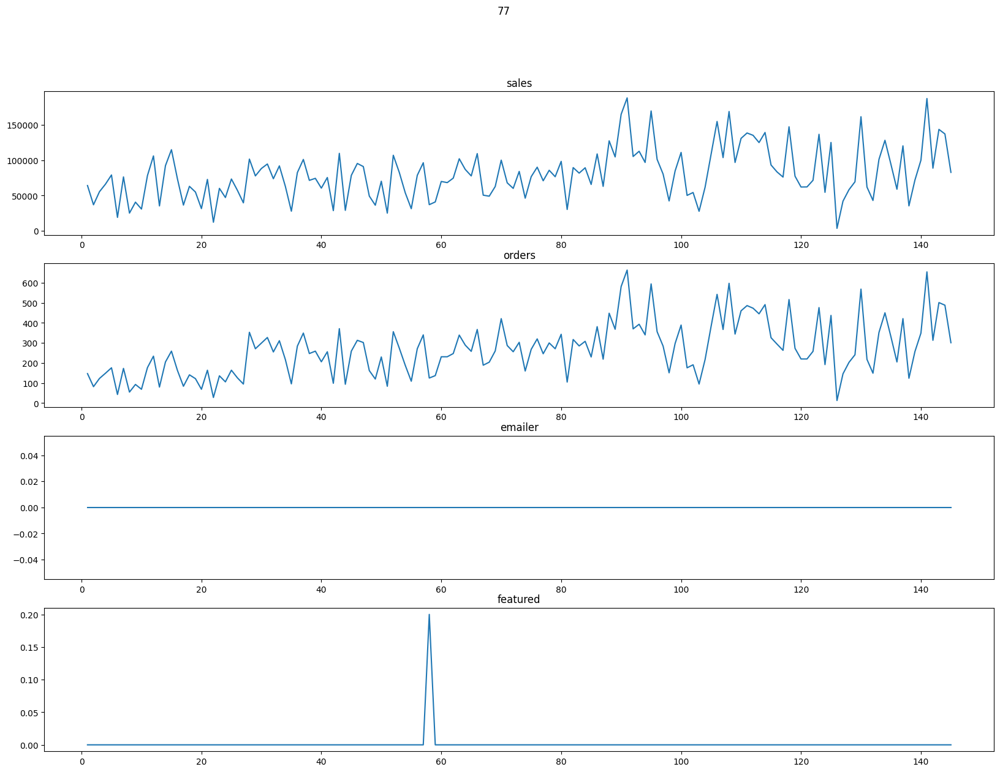

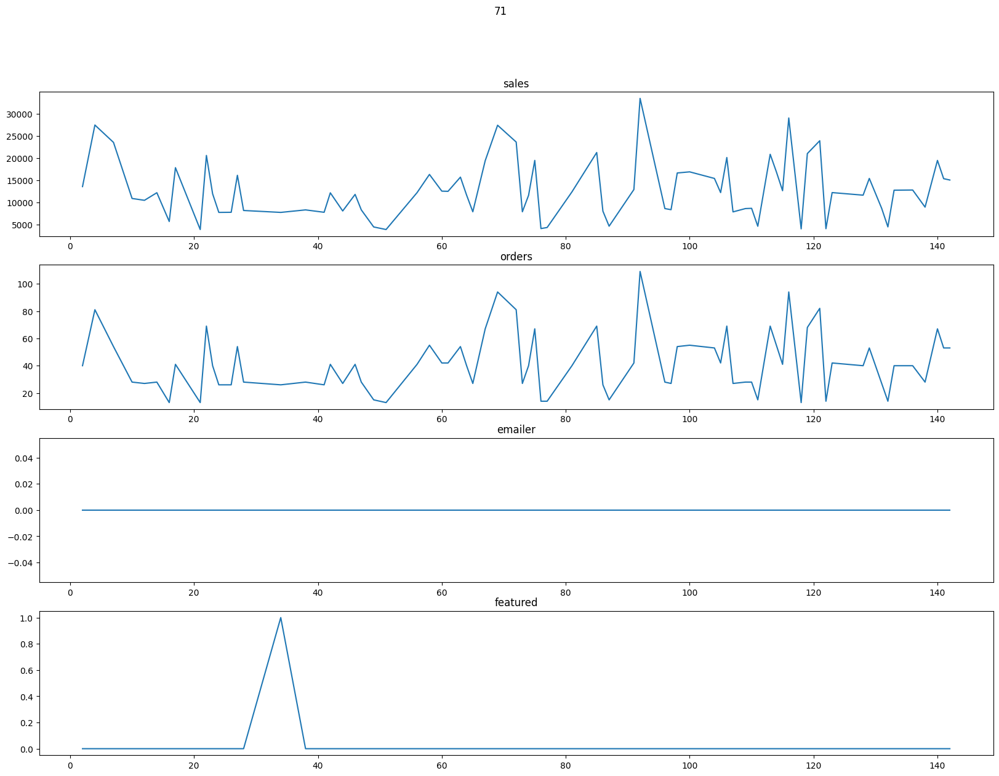

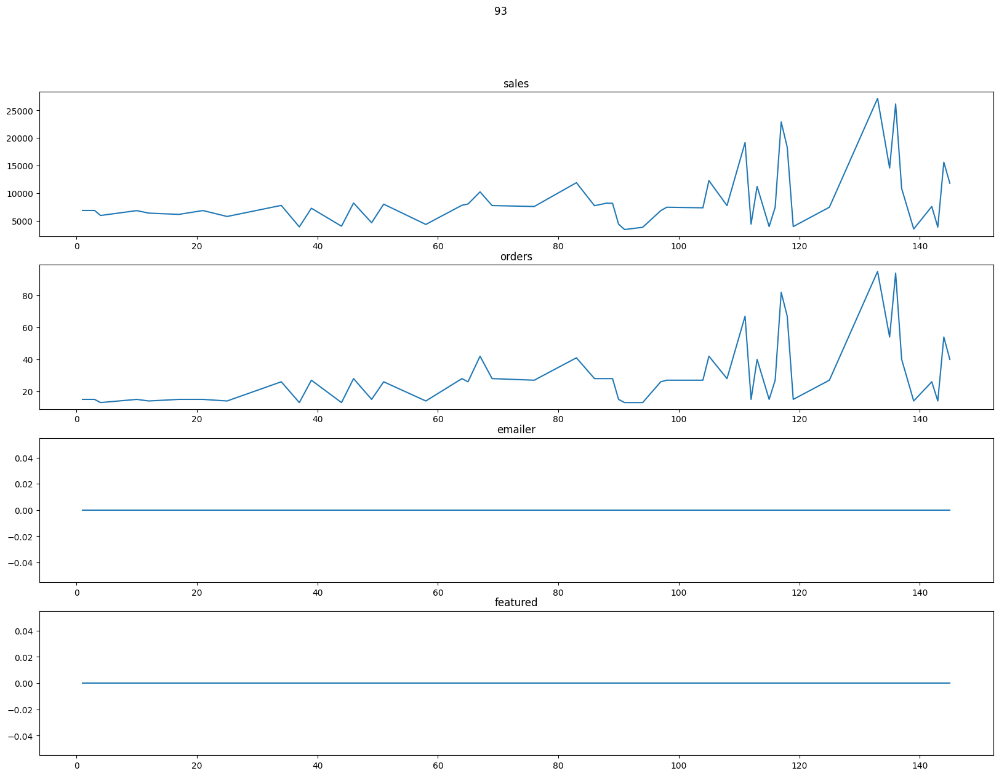

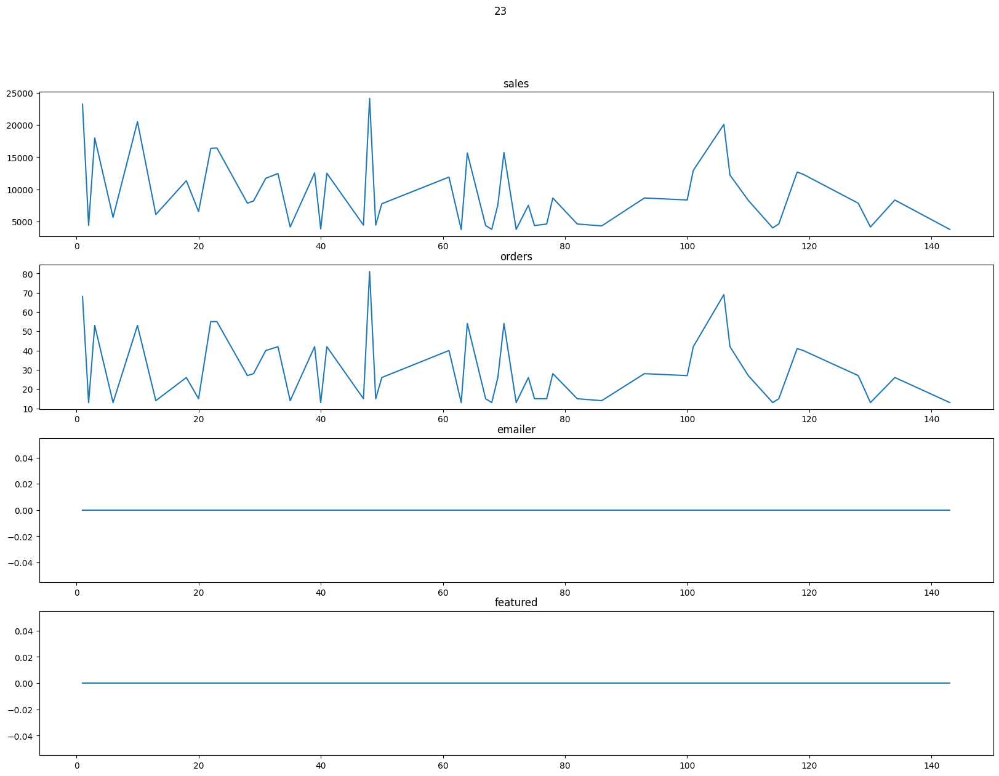

In [58]:
deliveries_meal_specified = deliveries[deliveries['meal_id']==2139]

for i in deliveries['region_code'].unique():
    region_specified = deliveries_meal_specified[deliveries_meal_specified['region_code']==i]
    weekly_region_specified =region_specified.groupby('week',as_index=False)\
                                                      .agg({'orders':'sum', 'sales':'sum', 'emailer':'mean', 'featured':'mean'})

    fig, ax = plt.subplots(figsize=(20,14), nrows = 4, ncols = 1)
    fig.suptitle(f'{i}')
    ax[0].plot(weekly_region_specified['week'], weekly_region_specified['sales'])
    ax[0].set_title('sales')
    ax[1].plot(weekly_region_specified['week'], weekly_region_specified['orders'])
    ax[1].set_title('orders')
    ax[2].plot(weekly_region_specified['week'], weekly_region_specified['emailer'])
    ax[2].set_title('emailer')
    ax[3].plot(weekly_region_specified['week'], weekly_region_specified['featured'])
    ax[3].set_title('featured')

    plt.show()

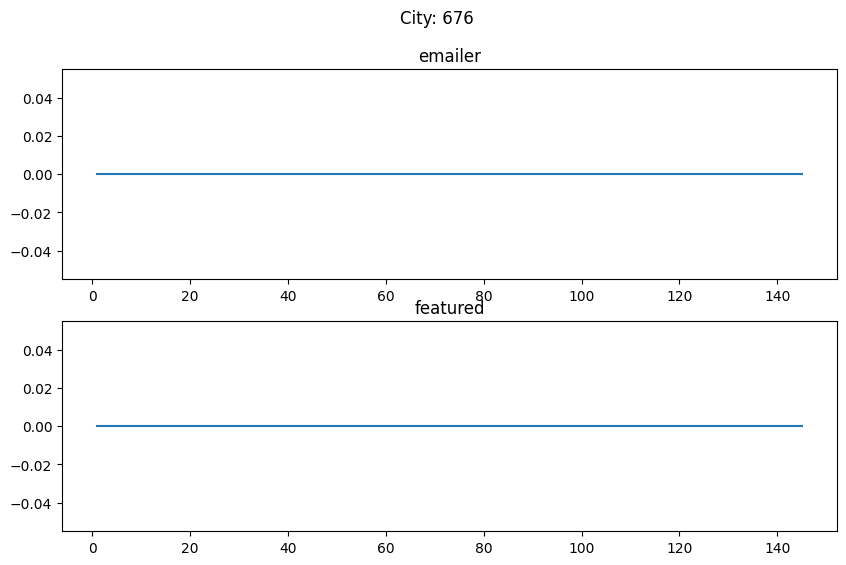

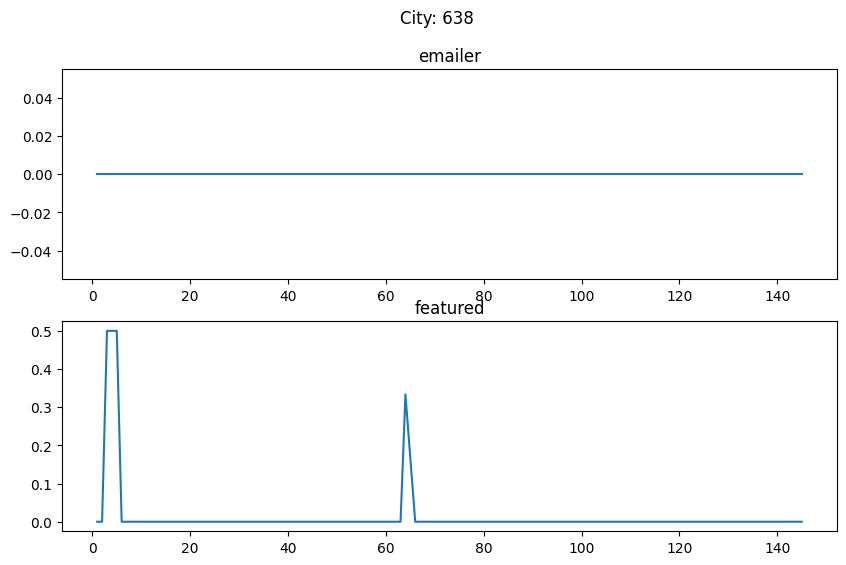

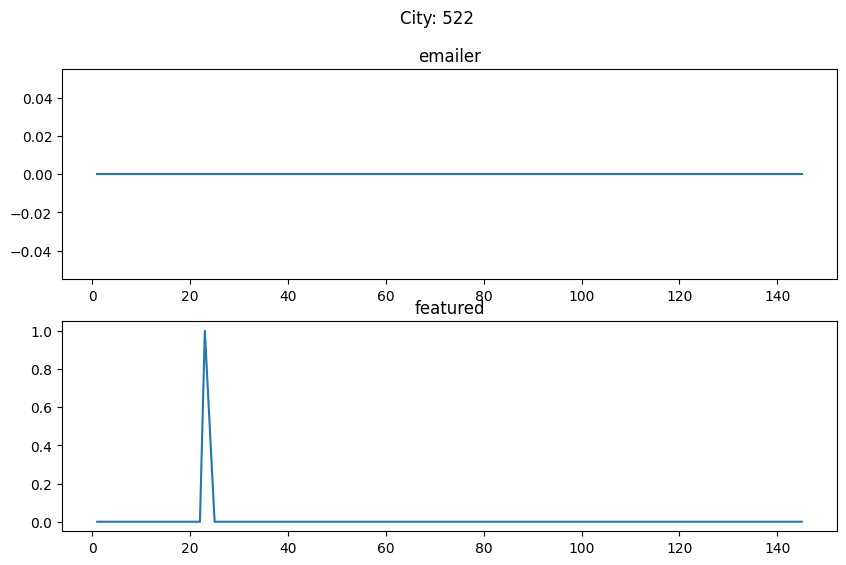

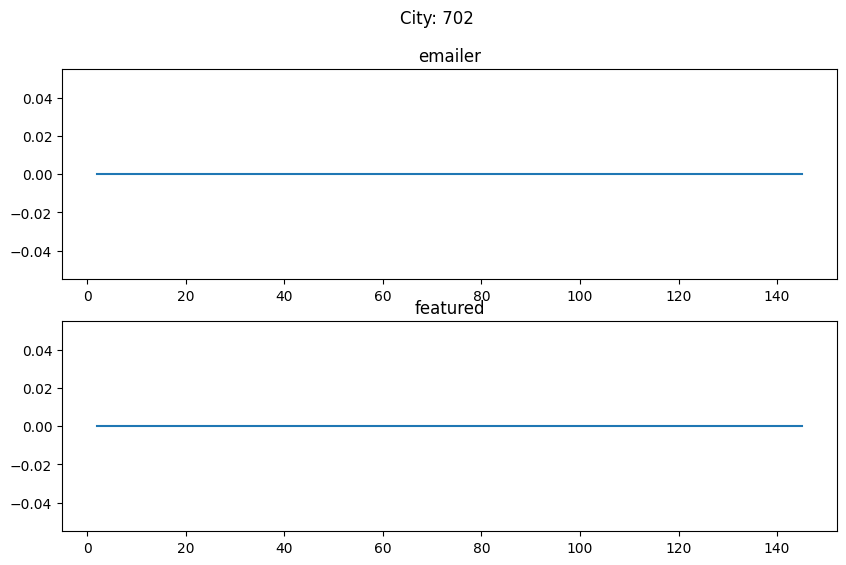

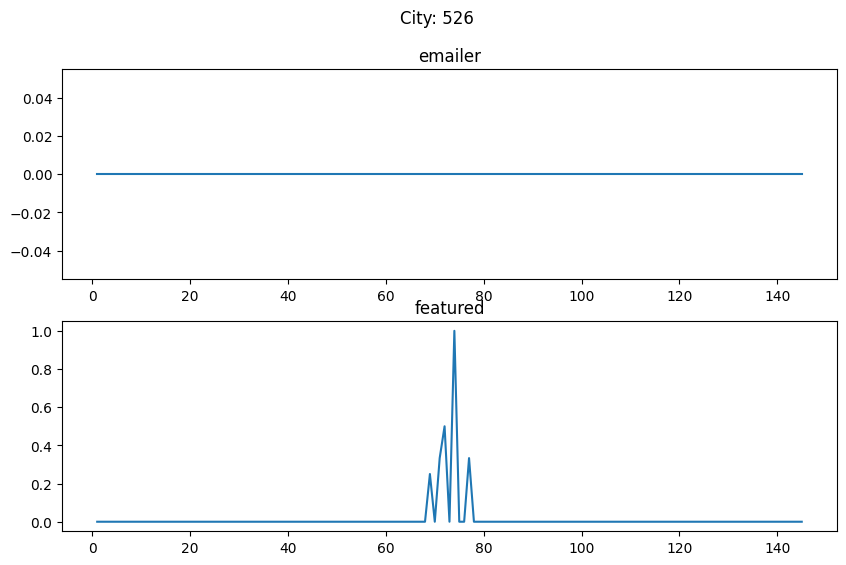

...

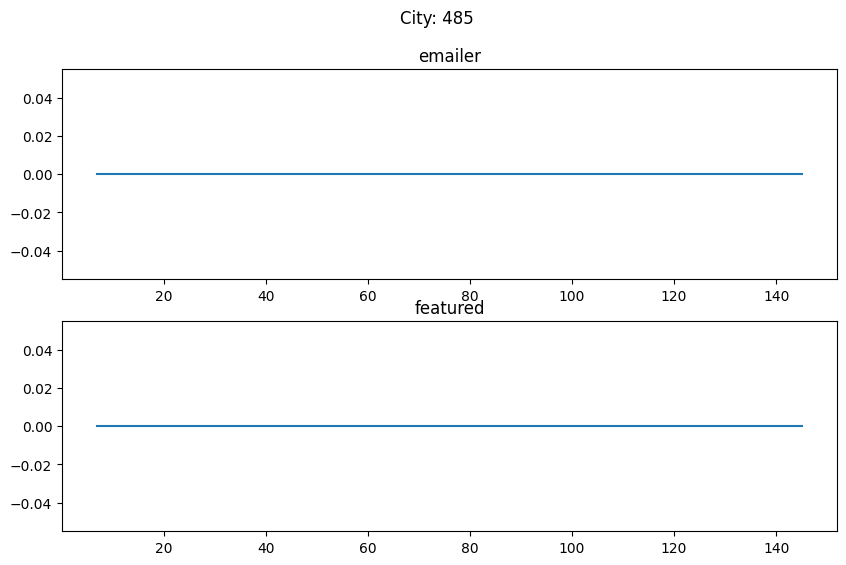

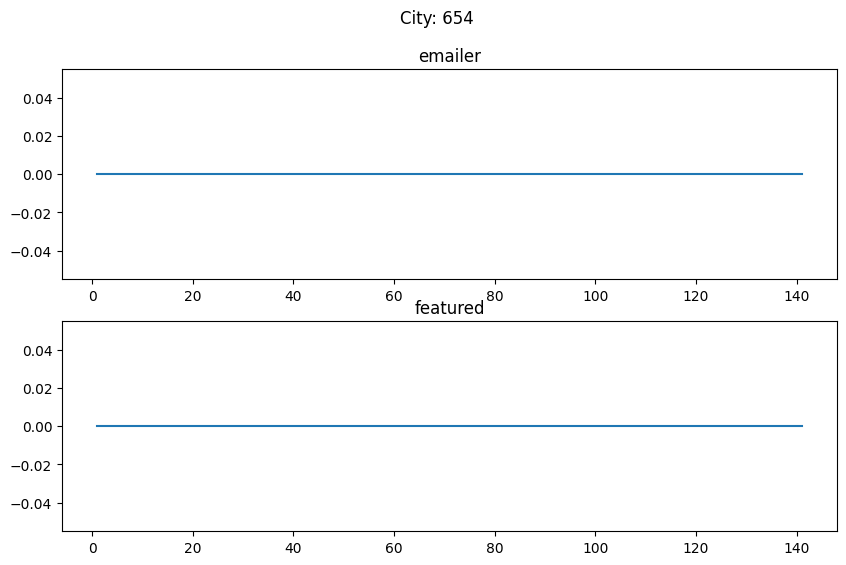

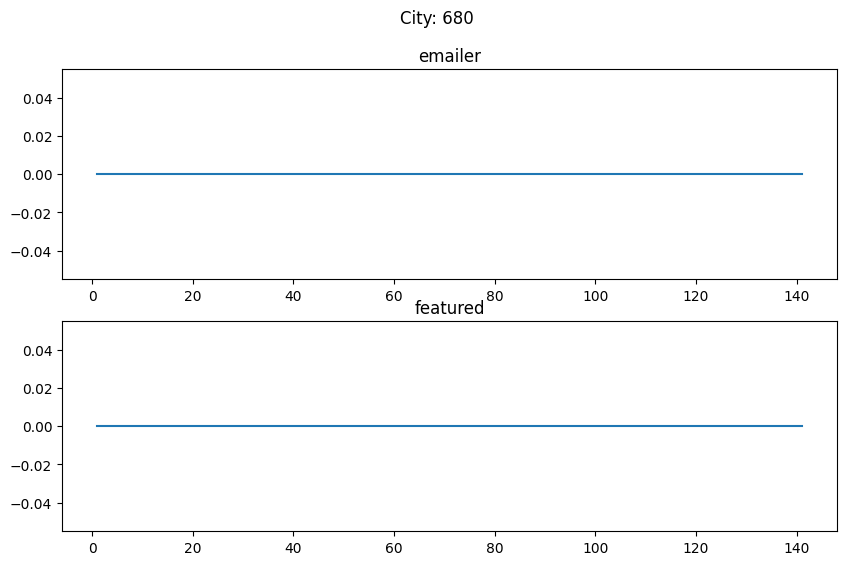

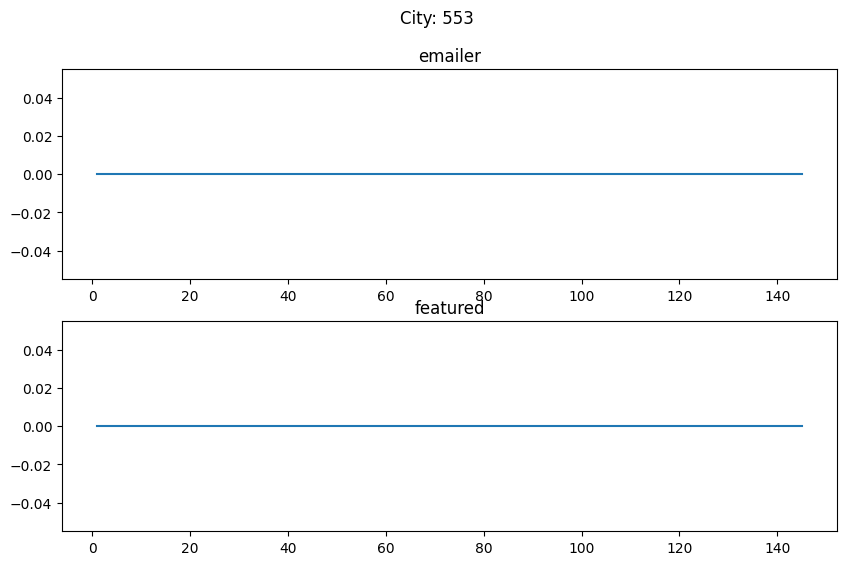

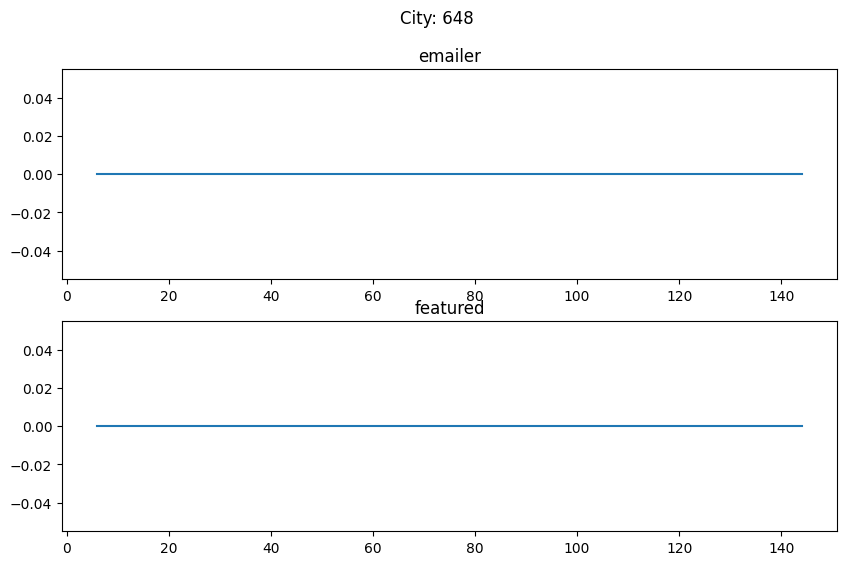

In [59]:
deliveries_meal_specified = deliveries[deliveries['meal_id']==2139]

for i in deliveries['city_code'].unique():
    city_specified = deliveries_meal_specified[deliveries_meal_specified['city_code']==i]
    weekly_city_specified =city_specified.groupby('week',as_index=False)\
                                                      .agg({'emailer':'mean', 'featured':'mean'})

    fig, ax = plt.subplots(figsize=(10,6), nrows = 2, ncols = 1)
    fig.suptitle(f'City: {i}')
    ax[0].plot(weekly_city_specified['week'], weekly_city_specified['emailer'])
    ax[0].set_title('emailer')
    ax[1].plot(weekly_city_specified['week'], weekly_city_specified['featured'])
    ax[1].set_title('featured')

    plt.show()

### First categorize promotion in one column. 1=emailer, 2=featured, 3=both, 0=none

In [60]:
deliveries.columns

Index(['id', 'week', 'center_id', 'city_code', 'region_code', 'center_type',
       'op_area', 'meal_id', 'category', 'cuisine', 'checkout_price',
       'base_price', 'emailer', 'featured', 'orders', 'sales', 'discount'],
      dtype='object')

In [61]:
print(deliveries['emailer'].unique())
print(deliveries['emailer'].dtype)

[0 1]
int64


In [62]:
print(deliveries['featured'].unique())
print(deliveries['featured'].dtype)

[0 1]
int64


In [63]:
promo_analysis_df = deliveries.copy()

email_only = (promo_analysis_df['emailer']==1)&(promo_analysis_df['featured']==0)
featured_only = (promo_analysis_df['emailer']==0)&(promo_analysis_df['featured']==1)
both_promo = (promo_analysis_df['emailer']==1)&(promo_analysis_df['featured']==1)
none_promo = (promo_analysis_df['emailer']==0)&(promo_analysis_df['featured']==0)

conditions = [email_only, featured_only, both_promo, none_promo]

promo_cat = [1, 2, 3, 0]

promo_analysis_df['promotion'] = np.select(conditions, promo_cat)

promo_analysis_df[['emailer','featured','promotion']].head()

,emailer,featured,promotion
114136,0,0,0
96763,0,1,2
189605,0,0,0
96636,1,0,1
189711,0,1,2


In [64]:
promo_analysis_df.groupby('promotion')[['sales']].mean()

,sales
promotion,
0,58019.712813
1,117350.751117
2,96402.681912
3,223669.898083


### Second, clean sales outliers for each meal_id in automated way

In [65]:
grouped_by_promo = promo_analysis_df.groupby(['meal_id', 'promotion'])[['sales']]

def detect_outliers_by_promo(df):
    Q1 = df['sales'].quantile(0.25)
    Q3 = df['sales'].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df['sales'] < lower_bound) | (df['sales'] > upper_bound)]

# Detect outliers for each meal_id and promotion_type group
outliers_by_promo = grouped_by_promo.apply(detect_outliers_by_promo)

# Optionally, remove the outliers
def remove_outliers_by_promo(df):
    outliers = detect_outliers_by_promo(df)
    return df[~df.isin(outliers)]

cleaned_promo_analysis_df = grouped_by_promo.apply(remove_outliers_by_promo)

### Create a loop to do anova for each meal_id
The dictionary contains: 
1. Columns observed
2. Featured or emailer or both or none
3. Sample size for each group
4. Mean for each group
5. p-value

In [66]:
cleaned_promo_analysis_df.reset_index(inplace=True)

In [67]:
cleaned_promo_analysis_df=cleaned_promo_analysis_df[['meal_id','promotion','sales']]

In [68]:
cleaned_promo_analysis_df=cleaned_promo_analysis_df[cleaned_promo_analysis_df['sales'].notna()]

In [69]:
# Function to calculate the one-way ANOVA, Tukey HSD, and mean for each promotion group
def anova_per_meal(meal_data):
    # Group sales by promotion type
    group_0 = meal_data[meal_data['promotion'] == 0]['sales']
    group_1 = meal_data[meal_data['promotion'] == 1]['sales']
    group_2 = meal_data[meal_data['promotion'] == 2]['sales']
    group_3 = meal_data[meal_data['promotion'] == 3]['sales']
    
    # Check if each group has at least two non-identical data points
    groups = [group_0, group_1, group_2, group_3]
    valid_groups = [group for group in groups if len(group) > 1 and group.nunique() > 1]
    
    # Perform one-way ANOVA only if there are at least two valid groups
    if len(valid_groups) >= 2:
        f_stat, p_value = f_oneway(*valid_groups)
    else:
        p_value = float('NaN')  # Set NaN if ANOVA cannot be performed
    
    # Calculate means for each promotion group
    mean_0 = group_0.mean() if not group_0.empty else None
    mean_1 = group_1.mean() if not group_1.empty else None
    mean_2 = group_2.mean() if not group_2.empty else None
    mean_3 = group_3.mean() if not group_3.empty else None

    tukey_result = "Not significant"  # Default result if no Tukey test is done

    # Perform Tukey HSD test if p-value < 0.05
    if p_value < 0.05:
        # Combine sales and promotion columns for Tukey HSD test
        tukey_data = meal_data[['sales', 'promotion']].dropna()
        tukey_test = pairwise_tukeyhsd(endog=tukey_data['sales'],
                                       groups=tukey_data['promotion'],
                                       alpha=0.05)
        tukey_result = tukey_test.summary().as_html()
        try:
            tukey_result = pd.read_html(tukey_result, header=0, index_col=0)[0].reset_index()
            tukey_result = tukey_result[tukey_result['reject']==True][['group1', 'group2']].values.tolist()
        except:
            pass
            
    return pd.Series({
        'mean_none': mean_0,
        'mean_email': mean_1,
        'mean_featured': mean_2,
        'mean_both': mean_3,
        'p_value': p_value,
        'tukey_result': tukey_result
    })

# Apply the function for each meal_id
result_df = cleaned_promo_analysis_df.groupby('meal_id').apply(anova_per_meal).reset_index()

# Display the result
display(result_df)

C:\Users\Biyan Bahtiar\AppData\Local\Temp\ipykernel_8656\413230551.py:36: FutureWarning: Passing literal html to 'read_html' is deprecated and will be removed in a future version. To read from a literal string, wrap it in a 'StringIO' object.
  tukey_result = pd.read_html(tukey_result, header=0, index_col=0)[0].reset_index()
C:\Users\Biyan Bahtiar\AppData\Local\Temp\ipykernel_8656\413230551.py:36: FutureWarning: Passing literal html to 'read_html' is deprecated and will be removed in a future version. To read from a literal string, wrap it in a 'StringIO' object.
  tukey_result = pd.read_html(tukey_result, header=0, index_col=0)[0].reset_index()
C:\Users\Biyan Bahtiar\AppData\Local\Temp\ipykernel_8656\413230551.py:36: FutureWarning: Passing literal html to 'read_html' is deprecated and will be removed in a future version. To read from a literal string, wrap it in a 'StringIO' object.
  tukey_result = pd.read_html(tukey_result, header=0, index_col=0)[0].reset_index()
C:\Users\Biyan Baht

,meal_id,mean_none,mean_email,mean_featured,mean_both,p_value,tukey_result
0,1062,66254.363985,64542.727569,113827.938969,112487.809091,2.825957e-58,"[[0, 2], [0, 3], [1, 2], [1, 3]]"
1,1109,114819.846529,178412.896277,166594.561682,326844.886305,0.000000e+00,"[[0, 1], [0, 2], [0, 3], [1, 3], [2, 3]]"
2,1198,37660.537397,NaN,40887.571481,NaN,5.325287e-01,Not significant
3,1207,43520.860442,71470.243304,104595.164058,118954.597904,0.000000e+00,"[[0, 1], [0, 2], [0, 3], [1, 2], [1, 3], [2, 3]]"
4,1216,18359.318481,22755.908231,20792.025697,26505.874118,6.954155e-13,"[[0, 1], [0, 2], [0, 3], [2, 3]]"
5,1230,44343.820707,76284.204384,106068.978026,125300.133218,0.000000e+00,"[[0, 1], [0, 2], [0, 3], [1, 2], [1, 3], [2, 3]]"
6,1247,13315.560473,NaN,11895.996154,NaN,5.197060e-01,Not significant
7,1248,8640.275899,15316.647520,12825.520241,22802.622747,7.472850e-179,"[[0, 1], [0, 2], [0, 3], [1, 2], [1, 3], [2, 3]]"
8,1311,46845.163845,NaN,56244.872581,NaN,1.335988e-01,Not significant
9,1438,17385.807256,NaN,36935.657727,NaN,1.088897e-49,"[[0, 2]]"


In [70]:
# manually input the best promo
result_df['best'] = [
    'featured', #1062
    'both', #1109
    'none', #1198
    'both', #1207
    'email', #1216
    'both', #1230
    'none', #1247
    'both', #1248
    'none', #1311
    'featured', #1438
    'both', #1445
    'featured', #1525
    'both', #1543
    'both', #1558
    'featured', #1571
    'email', #1727
    'both', #1754
    'featured', #1770
    'featured', #1778
    'featured', #1803
    'featured', #1847
    'both', #1878
    'featured', #1885
    'none', #1902
    'both', #1962
    'both', #1971
    'featured', #1993
    'featured', #2104
    'both', #2126
    'featured', #2139
    'both', #2290
    'both', #2304
    'both', #2306
    'both', #2322
    'both', #2444
    'both', #2490
    'both', #2492
    'featured', #2494
    'featured', #2539
    'both', #2569
    'both', #2577
    'both', #2581
    'both', #2631
    'both', #2640
    'both', #2664
    'featured', #2704
    'featured', #2707
    'featured', #2760
    'both', #2826
    'featured', #2867
    'both' #2956
]

result_df

,meal_id,mean_none,mean_email,mean_featured,mean_both,p_value,tukey_result,best
0,1062,66254.363985,64542.727569,113827.938969,112487.809091,2.825957e-58,"[[0, 2], [0, 3], [1, 2], [1, 3]]",featured
1,1109,114819.846529,178412.896277,166594.561682,326844.886305,0.000000e+00,"[[0, 1], [0, 2], [0, 3], [1, 3], [2, 3]]",both
2,1198,37660.537397,NaN,40887.571481,NaN,5.325287e-01,Not significant,none
3,1207,43520.860442,71470.243304,104595.164058,118954.597904,0.000000e+00,"[[0, 1], [0, 2], [0, 3], [1, 2], [1, 3], [2, 3]]",both
4,1216,18359.318481,22755.908231,20792.025697,26505.874118,6.954155e-13,"[[0, 1], [0, 2], [0, 3], [2, 3]]",email
5,1230,44343.820707,76284.204384,106068.978026,125300.133218,0.000000e+00,"[[0, 1], [0, 2], [0, 3], [1, 2], [1, 3], [2, 3]]",both
6,1247,13315.560473,NaN,11895.996154,NaN,5.197060e-01,Not significant,none
7,1248,8640.275899,15316.647520,12825.520241,22802.622747,7.472850e-179,"[[0, 1], [0, 2], [0, 3], [1, 2], [1, 3], [2, 3]]",both
8,1311,46845.163845,NaN,56244.872581,NaN,1.335988e-01,Not significant,none
9,1438,17385.807256,NaN,36935.657727,NaN,1.088897e-49,"[[0, 2]]",featured


# Forecast future orders

Steps:
1. Problem Definition:
   Explore ways of forecasting food order numbers to assist purchasing managers in their planning. Create a function to predict meal order for each meal_id and city.
2. Exploratory Analysis
3. Choose and fit models
   a. Create train and test set
   b. Create naive prediction
   c. Fit linear regression model
4. Evaluate forecasting models

## Explore

In [71]:
deliveries.columns

Index(['id', 'week', 'center_id', 'city_code', 'region_code', 'center_type',
       'op_area', 'meal_id', 'category', 'cuisine', 'checkout_price',
       'base_price', 'emailer', 'featured', 'orders', 'sales', 'discount'],
      dtype='object')

In [72]:
# Weekly Average order per meal per city, is there average order less than 1
raw_forecast = deliveries.copy()

average_order_meal_city = raw_forecast.groupby(['city_code', 'meal_id'])[['orders']].mean()
average_order_meal_city['mean_under_1'] = np.where(average_order_meal_city['orders']<1, 1, 0)
(average_order_meal_city['mean_under_1']>0).any()

False

In [73]:
# Weekly minimum order per meal per city, is there minimum order less than 1
min_order_meal_city = raw_forecast.groupby(['city_code', 'meal_id'])[['orders']].min()
min_order_meal_city['min_under_1'] = np.where(min_order_meal_city['orders']<1, 1, 0)
(min_order_meal_city['min_under_1']>0).any()

False

In [74]:
# How many cities
city_count = deliveries['city_code'].nunique()
print(f"Cities: {city_count}")

# How many meal_id
meal_id_count = deliveries['meal_id'].nunique()
print(f"Meal: {meal_id_count}")

# How many permutation
print(f"{city_count*meal_id_count}")

Cities: 51
Meal: 51
2601


In [75]:
#how many weeks
deliveries['week'].nunique()

145

## Clean dataset for forecasting needs

1. Create dataset for each city and meal_id per week, add columns for emailer, featured and discount.
2. Train, test split
3. Create PACF to determine highly correlated and above confidence interval lags, then create the shifts
4. Do naive prediction and linear regression
5. Evaluate the MAE

In [88]:
# Create dataset for each city and meal_id per week, add columns for emailer, featured and discount.
forecast_data = raw_forecast[['week', 'meal_id', 'city_code', 'emailer', 'featured', 'discount', 'orders','sales']]\
                .groupby(['week', 'meal_id', 'city_code'],as_index=False)\
                .agg({'orders':'sum','emailer':'max', 'featured':'max', 'discount':'max'})
forecast_data.head()

,week,meal_id,city_code,orders,emailer,featured,discount
0,1,1062,473,231,0,0,-1.164483
1,1,1062,478,365,0,0,0.632351
2,1,1062,485,460,0,0,-0.592382
3,1,1062,517,270,0,0,1.096732
4,1,1062,526,1407,0,0,0.602882


In [89]:
weeks_series = pd.DataFrame({'week': [i for i in range(1, 146, 1)]})
meal_id_series = pd.DataFrame({'meal_id':forecast_data['meal_id'].unique()})
city_code_series = pd.DataFrame({'city_code':forecast_data['city_code'].unique()})

base_wm = pd.merge(weeks_series, meal_id_series, how='cross')
base_wmc = pd.merge(base_wm, city_code_series, how='cross')

forecast_data_new = base_wmc.merge(forecast_data, on=['week', 'meal_id', 'city_code'], how='left').fillna(0)
forecast_data_new.head()

,week,meal_id,city_code,orders,emailer,featured,discount
0,1,1062,473,231.0,0.0,0.0,-1.164483
1,1,1062,478,365.0,0.0,0.0,0.632351
2,1,1062,485,460.0,0.0,0.0,-0.592382
3,1,1062,517,270.0,0.0,0.0,1.096732
4,1,1062,526,1407.0,0.0,0.0,0.602882


In [137]:
def naive_forecast(data): 
    data['naive_forecast'] = data['orders'].rolling(3).mean().shift(1)
    data['naive_forecast'] = data['naive_forecast'].fillna(0)
    return data
    
for (meal_id, city), group in forecast_data_new.groupby(['meal_id', 'city_code']):
    if (meal_id == 1062) & (city == 473):
        group = group.sort_values('week').reset_index(drop=True)
        
        pacf_values, confint = pacf(group['orders'], nlags=52, alpha=0.05)
        lower_conf = confint[:, 0]
        upper_conf = confint[:, 1]
        best_lags = [lag for lag, val in enumerate(pacf_values) if val < lower_conf[lag] or val > upper_conf[lag]]
        
        group = create_lag_features(group, best_lags)
        group = group.dropna()

        # Train-test split
        test_size = 0.2
        train_size = int(len(group) * (1 - test_size))
        train, test = group[:train_size], group[train_size:]

        # Naive forecast
        test = naive_forecast(test)
        
        # Train linear regression
        X_train = train.drop(columns=['orders', 'meal_id', 'city_code'])
        y_train = train['orders']
        X_test = test.drop(columns=['orders', 'naive_forecast', 'meal_id', 'city_code'])
        y_test = test['orders']
        
        lr_model = LinearRegression()
        lr_model.fit(X_train, y_train)
        test['lr_forecast'] = lr_model.predict(X_test)

        # Step 9: Predict on real data (forecast_df)
        subset_forecast = forecast_real[(forecast_real['meal_id'] == meal_id) & (forecast_real['city_code'] == city)]
        subset_forecast['week'] = forecast_data_new['week'].max() + 1

        for lag in best_lags:
            if lag is None:
                break
            subset_forecast[f'lag_{lag}'] = subset_forecast.apply(
                lambda row: train_df[(train_df['meal_id'] == row['meal_id']) & 
                                     (train_df['city_code'] == row['city_code']) & 
                                     (train_df['week'] == (row['week'] - lag))]['orders'].values[0]
                if len(train_df[(train_df['meal_id'] == row['meal_id']) & 
                                (train_df['city_code'] == row['city_code']) & 
                                (train_df['week'] == (row['week'] - lag))]['orders']) > 0
                else 0, axis=1
            )

        subset_forecast = subset_forecast.dropna()
        X_forecast = subset_forecast[X_train.columns]
        pred_lr = lr_model.predict(X_forecast)[0]
        
    else:
        continue

C:\Users\Biyan Bahtiar\AppData\Local\Temp\ipykernel_8656\3783129641.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['naive_forecast'] = data['orders'].rolling(3).mean().shift(1)
C:\Users\Biyan Bahtiar\AppData\Local\Temp\ipykernel_8656\3783129641.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['lr_forecast'] = lr_model.predict(X_test)


146.74557016076346

In [197]:
# Step 1: Define function to create lag features
def create_lag_features(data, lags):
    if lags is None:
        return data
    for lag in lags:
        data[f'lag_{lag}'] = data['orders'].shift(lag)
    return data

# Step 2: Naive forecast function
def naive_forecast(data): 
    data['naive_forecast'] = data['orders'].rolling(3).mean().shift(1)
    data['naive_forecast'] = data['naive_forecast'].fillna(0)
    return data

# Step 3: Forecast function with visualization and LightGBM
def forecast_meal(train_df, forecast_df, plot=True):
    """
    Function to forecast inputted dataframe using linear regression, LightGBM and naive prediction, with comparison plots.
    
    Parameters:
        train_df(pandas.core.frame.DataFrame): Training data with required columns (see docstring).
        forecast_df(pandas.core.frame.DataFrame): Current data to forecast with required columns (see docstring).
        plot(bool, default: True): If True, generate comparison line plots.
    
    Returns:
        result_df(pandas.core.frame.DataFrame): Results including forecasted and actual orders, along with MAE.
    """
    # Test parameter input if None
    if train_df is None:
        print('No train_df')
        return

    if forecast_df is None:
        print('No forecast data')
        return
        
    # Test required column
    train_req_col = ['week','meal_id','city_code', 'emailer', 'featured', 'discount', 'orders']
    forecast_req_col = ['meal_id', 'city_code', 'emailer', 'featured', 'discount']

    if not all(col in train_df.columns for col in train_req_col):
        print("Wrong input! Please read the docstring!")
        return

    if not all(col in forecast_df.columns for col in forecast_req_col):
        print("Wrong input! Please read the docstring!")
        return

    # Try to convert column content into numeric
    try:
        train_df = train_df[train_req_col].apply(pd.to_numeric)
        forecast_df = forecast_df[forecast_req_col].apply(pd.to_numeric)
    except:
        print("Data can't be converted into number! Read the docstring!")
        return

    # Check if same meal_id and city_code combination exists in both df
    check_df = train_df[['meal_id', 'city_code']].drop_duplicates(subset=['meal_id', 'city_code'])
    if not all(id_list in check_df[['meal_id', 'city_code']].values for id_list in forecast_df[['meal_id', 'city_code']].values):
        print("Missing some combination of meal_id and city_code! Check the docstring!")
        return

    # The machine learning part
    results = []
    test_size = 0.2

    # Loop through each meal_id and city combination
    for meal_id, city in forecast_df[['meal_id', 'city_code']].values:
        select_meal = train_df['meal_id'] == meal_id
        select_city = train_df['city_code'] == city
        group = train_df[select_meal & select_city]
        group = group.sort_values('week').reset_index(drop=True)
    
        # Step 4: Create lag features based on PACF with confidence interval
        pacf_values, confint = pacf(group['orders'], nlags=52, alpha=0.05)
        lower_conf = confint[:, 0]
        upper_conf = confint[:, 1]
        best_lags = [lag for lag, val in enumerate(pacf_values) if val < lower_conf[lag] or val > upper_conf[lag]]
    
        group = create_lag_features(group, best_lags)
        group = group.dropna()
    
        # Train-test split
        train_size = int(len(group) * (1 - test_size))
        train, test = group[:train_size], group[train_size:]
    
        # Naive forecast
        test = naive_forecast(group)[train_size:]
    
        # Train linear regression
        X_train = train.drop(columns=['orders', 'meal_id', 'city_code'])
        y_train = train['orders']
        X_test = test.drop(columns=['orders', 'naive_forecast', 'meal_id', 'city_code'])
        y_test = test['orders']
    
        # Linear Regression
        lr_model = LinearRegression()
        lr_model.fit(X_train, y_train)
        test['lr_forecast'] = lr_model.predict(X_test)
    
        # LightGBM with Random Search
        lgb_model = lgb.LGBMRegressor(random_state=42, verbosity=-1)
        param_dist = {
            'num_leaves': [31, 50, 70],
            'learning_rate': [0.01, 0.05, 0.1],
            'n_estimators': [100, 200, 300],
            'max_depth': [5, 7, 10],
        }
        random_search = RandomizedSearchCV(lgb_model, param_distributions=param_dist, n_iter=10, 
                                           cv=3, random_state=42, scoring='neg_mean_absolute_error')
        random_search.fit(X_train, y_train)
        test['lgb_forecast'] = random_search.predict(X_test)
    
        # MAE calculation
        naive_mae = mean_absolute_error(test['orders'], test['naive_forecast'])
        lr_mae = mean_absolute_error(test['orders'], test['lr_forecast'])
        lgb_mae = mean_absolute_error(test['orders'], test['lgb_forecast'])
    
        # Step 9: Predict on real data (forecast_df)
        subset_forecast = forecast_df[(forecast_df['meal_id'] == meal_id) & (forecast_df['city_code'] == city)]
        subset_forecast['week'] = train_df['week'].max() + 1
    
        for lag in best_lags:
            if lag is None:
                break
            subset_forecast[f'lag_{lag}'] = subset_forecast.apply(
                lambda row: train_df[(train_df['meal_id'] == row['meal_id']) & 
                                     (train_df['city_code'] == row['city_code']) & 
                                     (train_df['week'] == (row['week'] - lag))]['orders'].values[0]
                if len(train_df[(train_df['meal_id'] == row['meal_id']) & 
                                (train_df['city_code'] == row['city_code']) & 
                                (train_df['week'] == (row['week'] - lag))]['orders']) > 0
                else 0, axis=1
            )
    
        subset_forecast = subset_forecast.dropna()
        X_forecast = subset_forecast[X_train.columns]

        pred_lr = lr_model.predict(X_forecast)[0]
        pred_naive = group[group['week'] == group['week'].max()]['orders'].values[0]
        pred_lgb = random_search.predict(X_forecast)[0]

        results.append({
            'meal_id': meal_id,
            'city': city,
            'emailer': subset_forecast['emailer'].values[0],
            'featured': subset_forecast['featured'].values[0],
            'discount': subset_forecast['discount'].values[0],
            'pred_naive': pred_naive,
            'pred_lr': pred_lr,
            'pred_lgb': pred_lgb,
            'naive_mae': naive_mae,
            'lr_mae': lr_mae,
            'lgb_mae': lgb_mae
        })

        # Step 10: Plot comparison if requested
        if plot:
            plt.figure(figsize=(10, 6))
            sns.lineplot(x=test['week'], y=test['orders'], label='Test Orders', marker='o')
            sns.lineplot(x=test['week'], y=test['naive_forecast'], label='Naive Forecast', marker='o')
            sns.lineplot(x=test['week'], y=test['lr_forecast'], label='LR Forecast', marker='o')
            sns.lineplot(x=test['week'], y=test['lgb_forecast'], label='LGBM Forecast', marker='o')
            plt.title(f'Forecast Comparison for Meal ID: {meal_id} and City: {city}')
            plt.xlabel('Week')
            plt.ylabel('Orders')
            plt.legend()
            plt.show()

    return pd.DataFrame(results)

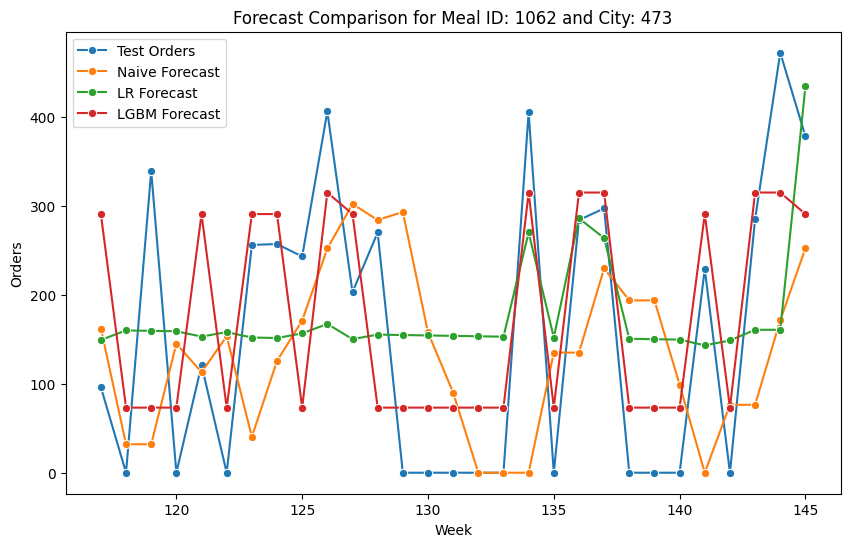

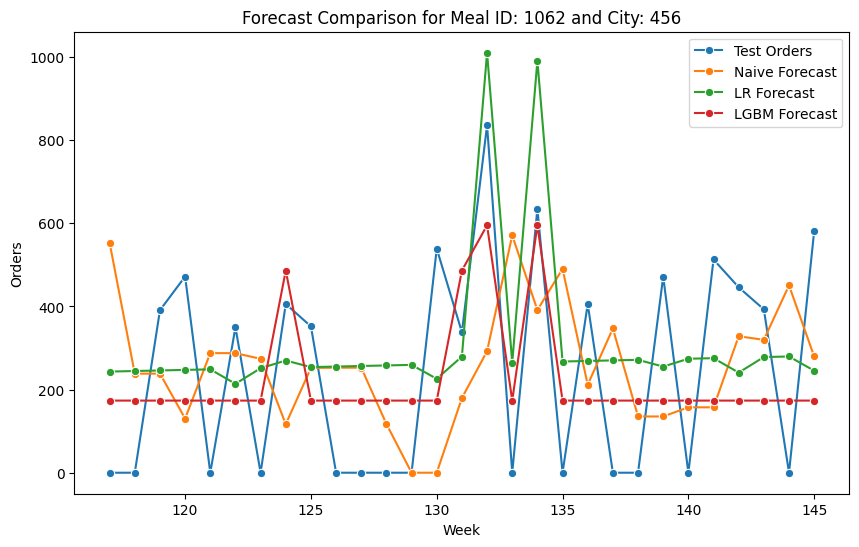

,meal_id,city,emailer,featured,discount,pred_naive,pred_lr,pred_lgb,naive_mae,lr_mae,lgb_mae
0,1062,473,1,1,0.3,378.0,468.756486,290.669072,142.103448,127.986662,92.067435
1,1062,456,1,1,0.3,581.0,682.639662,173.505259,273.689655,225.318894,204.995413


In [199]:
# Create forecast with real data
forecast_real = pd.DataFrame({
    'meal_id':[1062, 1062],
    'city_code':[473, 456],
    'emailer':[1, 1],
    'featured':[1, 1],
    'discount':[0.3, 0.3]
})

# Step 11: Call the function and pass your dataframe
result_df = forecast_meal(forecast_data_new, forecast_real)

# Step 12: View results
display(result_df)